## Import Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.graphics.regressionplots import influence_plot
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine,correlation
%matplotlib inline

## Read Dataset

In [2]:
#devotional = pd.read_csv('hindi_devotional_songs.csv')
#devotional = pd.read_csv('sanskrit_devotional_songs.csv')
#devotional = pd.read_csv('gujarati_devotional_songs.csv')
#devotional = pd.read_csv('marathi_devotional_songs.csv')
#devotional = pd.read_csv('punjabi_devotional_songs.csv')
#devotional = pd.read_csv('malayalam_devotional_songs.csv')
#devotional = pd.read_csv('tamil_devotional_songs.csv')
devotional = pd.read_csv('telugu_devotional_songs.csv')
devotional.head()

,Track URI,Track Name,Artist URI(s),Artist Name(s),Album URI,Album Name,Album Artist URI(s),Album Artist Name(s),Album Release Date,Album Image URL,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Language
0,spotify:track:07MBmkLZClagalPWHiVdBn,Sri Venkatesa Suprabatham,spotify:artist:1aCXz3s5Uo0oOX3jp1hPb4,Anuradha Krishnamoorthy,spotify:album:0lM42LruNYoV8YYwBs655y,Suprabatham,spotify:artist:1aCXz3s5Uo0oOX3jp1hPb4,Anuradha Krishnamoorthy,21-11-1999,https://i.scdn.co/image/ab67616d0000b273e0f77d...,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,spotify:track:7sRyejjZ7Ebkgo1sy6Gmfj,Shree Ganeshay Dheemahi,spotify:artist:5fvTHKKzW44A9867nPDocM,Ajay-Atul,spotify:album:7pBI5ObmHmMbFi537wORHH,Ganesha Symphonic Chants Experience,spotify:artist:5fvTHKKzW44A9867nPDocM,Ajay-Atul,2001,https://i.scdn.co/image/ab67616d0000b273a55cbf...,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,spotify:track:1BqjKWtv2ipp2eF0MgVLeI,Kondalalo Nelakonna,"spotify:artist:4ik94hI7KwXxr7Tth6inQH, spotify...","Annamayya Keerthana, S. P. Balasubrahmanyam",spotify:album:6rMl6JDfVR3Nz2VCTeSoGg,Annamayya,spotify:artist:12l1SqSNsg2mI2IcXpPWjR,M. M. Keeravani,01-01-1997,https://i.scdn.co/image/ab67616d0000b2739b87d7...,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,spotify:track:3BM77eR1tvoUmwkQrfUdlk,Paluke Bangaramayera,"spotify:artist:12l1SqSNsg2mI2IcXpPWjR, spotify...","M. M. Keeravani, K. S. Chithra",spotify:album:3EyrNf6BihkBZxnbM6h6q2,Sri Ramadasu,spotify:artist:12l1SqSNsg2mI2IcXpPWjR,M. M. Keeravani,13-01-2006,https://i.scdn.co/image/ab67616d0000b273c18bc2...,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,spotify:track:74VFvLwTnReHu8RFHaahx7,Andhari Bhanduvayya,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:71EAAUyMdzabE30Dwu5NcQ,Devullu,spotify:artist:6X7Q0PvITPOqe8vg4BW7Ib,Vandemataram Srinivas,09-05-2001,https://i.scdn.co/image/ab67616d0000b273fa44f2...,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


In [307]:
devotional.tail()

,Track URI,Track Name,Artist URI(s),Artist Name(s),Album URI,Album Name,Album Artist URI(s),Album Artist Name(s),Album Release Date,Album Image URL,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Language
632,spotify:track:096I6QMUdYVwrvzWsqCF93,Narayana Manthram,spotify:artist:0aFGod7DM6b3O5l1AmvFwK,P. Susheela,spotify:album:0FEracwlJhEtHcAf0hqaV0,Bhakta Prahalada,"spotify:artist:6DLhErz4XAVQYZpHxmuFKM, spotify...","S. Rajeswara Rao, S.N.Rajeswari Rao",31-12-1974,https://i.scdn.co/image/ab67616d0000b273a4fd11...,...,-4.290,1,0.0379,0.9390,0.229000,0.6070,0.561,79.362,4,Telugu
633,spotify:track:1kNNiScmfvqJyK3EebJP0I,Sri Seetharamula Kalyanam,spotify:artist:0aFGod7DM6b3O5l1AmvFwK,P. Susheela,spotify:album:11m92q3xuTTCAbA0QQHrFO,Seetharama Kalyanam,spotify:artist:0LyfQWJT6nXafLPZqxe9Of,Various Artists,31-12-1961,https://i.scdn.co/image/ab67616d0000b27370932d...,...,-12.154,0,0.0995,0.9400,0.820000,0.3890,0.856,156.954,4,Telugu
634,spotify:track:17S1tkwmNtucQn038KtKLo,Dandakam,"spotify:artist:6lvKns8ewLQs9B9iWaQZLF, spotify...","Gangadhar Sastry, Gopichand",spotify:album:0DvJIxkdwk4oY7856Yx53G,Nijam,spotify:artist:00hL0oJD4pWef0kPYIaSTy,R. P. Patnaik,23-05-2003,https://i.scdn.co/image/ab67616d0000b273b173c3...,...,-5.045,1,0.1310,0.0204,0.000013,0.0889,0.570,91.486,3,Telugu
635,spotify:track:6WIh4TzlwHXcKyQmHEj6ln,Deva Devam,spotify:artist:2j38RpoRe1bvrODZmJxXyp,Palakkad Shreeram|Rita,spotify:album:4rjF7pEttnd3hMEt7iuzgk,Attarrintiki Daaredi,spotify:artist:5sSzCxHtgL82pYDvx2QyEU,Devi Sri Prasad,19-07-2013,https://i.scdn.co/image/ab67616d0000b273f7422e...,...,-5.604,1,0.2190,0.4480,0.000000,0.1090,0.695,175.876,5,Telugu
636,spotify:track:05NFvbg48cG35eZCVKRPRe,"Namah Shivaya (From ""Natyam"")","spotify:artist:4tejKImNVmDcORNBuZ1l14, spotify...","Kala Bhairava, Lalitha Kavya, Shravan Bharadwaj",spotify:album:1S2x1ywHD108eUDzbXkyfX,"Namah Shivaya (From ""Natyam"")","spotify:artist:4tejKImNVmDcORNBuZ1l14, spotify...","Kala Bhairava, Lalitha Kavya, Shravan Bharadwaj",06-08-2021,https://i.scdn.co/image/ab67616d0000b273d8b41d...,...,-6.389,1,0.0704,0.5640,0.004020,0.2070,0.711,171.880,4,Telugu


# Exploratory Data Analysis

### Getting information about the dataset

In [308]:
devotional.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 637 entries, 0 to 636
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Track URI             637 non-null    object 
 1   Track Name            635 non-null    object 
 2   Artist URI(s)         637 non-null    object 
 3   Artist Name(s)        635 non-null    object 
 4   Album URI             637 non-null    object 
 5   Album Name            635 non-null    object 
 6   Album Artist URI(s)   637 non-null    object 
 7   Album Artist Name(s)  635 non-null    object 
 8   Album Release Date    637 non-null    object 
 9   Album Image URL       635 non-null    object 
 10  Disc Number           637 non-null    int64  
 11  Track Number          637 non-null    int64  
 12  Track Duration (ms)   637 non-null    int64  
 13  Track Preview URL     531 non-null    object 
 14  Explicit              637 non-null    bool   
 15  Popularity            6

In [309]:
devotional.shape

(637, 32)

In [310]:
devotional.columns

Index(['Track URI', 'Track Name', 'Artist URI(s)', 'Artist Name(s)',
       'Album URI', 'Album Name', 'Album Artist URI(s)',
       'Album Artist Name(s)', 'Album Release Date', 'Album Image URL',
       'Disc Number', 'Track Number', 'Track Duration (ms)',
       'Track Preview URL', 'Explicit', 'Popularity', 'Added By', 'Added At',
       'Artist Genres', 'Danceability', 'Energy', 'Key', 'Loudness', 'Mode',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Tempo', 'Time Signature', 'Language'],
      dtype='object')

In [311]:
devotional[['Track Name','Artist Name(s)','Artist Genres','Track Duration (ms)','Popularity','Language']].head(20)

,Track Name,Artist Name(s),Artist Genres,Track Duration (ms),Popularity,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,telugu devotional,1301269,34,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,"desi hip hop,desi pop,filmi,modern bollywood",407706,45,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam","telugu devotional,filmi",89202,43,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra","classic tollywood,filmi,filmi",237718,41,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,filmi,340656,40,Telugu
5,Bhadra Shaila,Hariharan,"filmi,ghazal,tamil pop",297536,40,Telugu
6,Maha Kanaka Durga,S. Janaki,"classic kollywood,filmi",309514,39,Telugu
7,Nigama Nigamantha,"Annamayya Keerthana, S. P. Balasubrahmanyam, K...","telugu devotional,filmi,filmi",235323,44,Telugu
8,Sri Ram Ramethi,M. M. Keeravani,"classic tollywood,filmi",43982,38,Telugu
9,Sirula Nosage,"Swarnalatha, Sujatha","filmi,tamil pop,filmi,malayalam pop",332570,37,Telugu


In [312]:
devotional[['Track Name','Artist Name(s)','Artist Genres','Track Duration (ms)','Popularity','Language']].tail(20)

,Track Name,Artist Name(s),Artist Genres,Track Duration (ms),Popularity,Language
617,Madhura Nagarilo,Nithya Santhoshini,telugu devotional,295040,21,Telugu
618,Nandalaala,Nutana Mohan,tollywood,202388,16,Telugu
619,Challa Galito Pilam Grovi,Gayatri,NaN,299813,7,Telugu
620,Paluke Bangaramayenaa,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",250451,18,Telugu
621,Mouname Nee Bhaasha,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",231573,19,Telugu
622,Nagumomu - Abheri - Adi,"Tyagaraja, M. Balamuralikrishna","carnatic,carnatic,carnatic vocal,indian classi...",1761106,10,Telugu
623,Nanu Brovamani Cheppave,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",194380,13,Telugu
624,Jo Jo Mukunda,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",218723,12,Telugu
625,Tharaka Mantramu,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",205219,13,Telugu
626,Ea Theeruga Nanu Dhaya Choochedhavo,M. Balamuralikrishna,"carnatic,carnatic vocal,indian classical,veena",375703,14,Telugu


In [313]:
devotional.iloc[100] # using iloc to read each row

Track URI                            spotify:track:3A4MylCDigG25SULPFXJfZ
Track Name                         Shantakaram Bhujagashayanam - 11 Times
Artist URI(s)                       spotify:artist:5rwA4CFXXkendN5FrITi2w
Artist Name(s)                                         Mangesh Borgaonkar
Album URI                            spotify:album:0UWvzBobcjFC71EaXCUs1G
Album Name                         Shantakaram Bhujagashayanam - 11 Times
Album Artist URI(s)                 spotify:artist:5rwA4CFXXkendN5FrITi2w
Album Artist Name(s)                                   Mangesh Borgaonkar
Album Release Date                                             29-10-2019
Album Image URL         https://i.scdn.co/image/ab67616d0000b273351c3d...
Disc Number                                                             1
Track Number                                                            1
Track Duration (ms)                                                404000
Track Preview URL       https://p.scdn

In [314]:
# to know which row has which song

for index,row in devotional.iterrows():
    print(index,row['Track Name'])

0 Sri Venkatesa Suprabatham
1 Shree Ganeshay Dheemahi
2 Kondalalo Nelakonna
3 Paluke Bangaramayera
4 Andhari Bhanduvayya
5 Bhadra Shaila
6 Maha Kanaka Durga
7 Nigama Nigamantha
8 Sri Ram Ramethi
9 Sirula Nosage
10 Deva Shree Ganesha
11 Govindha Hari Govindha
12 Brahmanda Bhandamula
13 Aanandham
14 Omkaram Srusthi
15 Akhilanda Koti
16 Brahmothsava
17 Anda Pinda
18 Asmadeeya
19 Vinaro Bhagyamu
20 Moosina Muthyalake
21 Podagantimayya
22 Tlugu Padaniki
23 Ele Ele Maradalaa
24 Padharu Kalalaku
25 Kalaganti Kalaganti
26 Adivo Alladivo
27 Suddha Brahma
28 Veyi Naamaala Vaada
29 Aigiri Nandini - Mahishasura Mardini Stotram
30 Hylessa
31 Kanulara Chuddam
32 Sri Raghavam
33 Adhigadhigo
34 Ekshvaku Kula
35 Idhigidhigo
36 Charanamulane
37 Chalu Chalu
38 Nanu Brovamani
39 Yentho Ruchira
40 Rama Rama
41 Bhajare Nanda Gopala
42 Gopala Gopala (Theme)
43 Shiva Shiva Shankara
44 Aigiri Nandini - Rock Version
45 Vakrathunda Mahakaya
46 Sita Rama Charitham - Telugu
47 Slokam
48 Sharanu Sharanu
49 Sri Hanu

In [315]:
devotional.loc[devotional['Artist Name(s)'] == 'Anup Jalota']

,Track URI,Track Name,Artist URI(s),Artist Name(s),Album URI,Album Name,Album Artist URI(s),Album Artist Name(s),Album Release Date,Album Image URL,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Language


### Sorting and Describing the dataset

In [316]:
devotional.describe()

,Disc Number,Track Number,Track Duration (ms),Popularity,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature
count,637.000000,637.000000,6.370000e+02,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000
mean,1.026688,6.207221,3.575888e+05,17.281005,0.559733,0.538995,4.919937,-8.528364,0.678179,0.093316,0.742635,0.039017,0.235889,0.634310,117.532157,3.803768
std,0.239714,5.705929,3.347872e+05,14.221336,0.126473,0.188074,3.300209,3.102209,0.467542,0.099576,0.219520,0.155954,0.172924,0.208166,30.744855,0.783548
min,1.000000,1.000000,2.627300e+04,0.000000,0.155000,0.012600,0.000000,-22.063000,0.000000,0.026600,0.018400,0.000000,0.033300,0.037100,37.811000,1.000000
25%,1.000000,2.000000,2.034800e+05,3.000000,0.474000,0.396000,2.000000,-10.620000,0.000000,0.041200,0.653000,0.000000,0.106000,0.492000,92.008000,4.000000
50%,1.000000,5.000000,2.762260e+05,16.000000,0.556000,0.535000,5.000000,-8.439000,1.000000,0.055800,0.786000,0.000001,0.177000,0.663000,112.884000,4.000000
75%,1.000000,8.000000,3.791600e+05,30.000000,0.648000,0.675000,7.000000,-6.360000,1.000000,0.100000,0.904000,0.000137,0.325000,0.799000,143.332000,4.000000
max,5.000000,36.000000,3.340672e+06,59.000000,0.908000,0.960000,11.000000,-0.572000,1.000000,0.899000,0.995000,0.975000,0.948000,0.977000,189.909000,5.000000


In [317]:
devotional.sort_values(['Track Name'])

,Track URI,Track Name,Artist URI(s),Artist Name(s),Album URI,Album Name,Album Artist URI(s),Album Artist Name(s),Album Release Date,Album Image URL,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Language
606,spotify:track:044vPgQ1FtS7dAZXh152sl,Aadhi Bikshuvu,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:3qnVA8co26dSWsDvgoAlYc,Sirivennela,"spotify:artist:15yz38oBmpgT4UIiWADOyX, spotify...","K. V. Mahadevan, Sirivennela Seetharama Sastry...",31-12-1986,https://i.scdn.co/image/ab67616d0000b273549b5a...,...,-6.388,1,0.0537,0.844,0.000000,0.0606,0.792,156.338,4,Telugu
260,spotify:track:5Oal4SWL4Qn0x5c2lW6mqi,Aadhi Bikshuvu,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:4OOa9WugK37V1hgs4NGhmw,Sirivennela (Original Motion Picture Soundtrack),spotify:artist:15yz38oBmpgT4UIiWADOyX,K. V. Mahadevan,31-12-1986,https://i.scdn.co/image/ab67616d0000b273f925e8...,...,-6.388,1,0.0530,0.844,0.000000,0.0606,0.792,156.567,4,Telugu
384,spotify:track:4cr4ud4H2VO59IXY4J1vKo,Aakashame Aakaramai,"spotify:artist:2ae6PxICSOZHvjqiCcgon8, spotify...","S. P. Balasubrahmanyam, Anuradha Sriram",spotify:album:4KAxF4cG97SPUMphQAJnhA,Sri Manjunatha (Original Motion Picture Soundt...,spotify:artist:2i6aLQJQqwTbIcyFpQAXGA,Hamsa Lekha,01-12-2002,https://i.scdn.co/image/ab67616d0000b273d57f32...,...,-10.958,1,0.0968,0.520,0.000005,0.3110,0.460,94.863,4,Telugu
13,spotify:track:2xQ6Xe8AFajZ4yoJXKttGE,Aanandham,"spotify:artist:4Qv21cLGHUxyffRHV7vaUp, spotify...","Sarath Santosh, Shweta Pandit",spotify:album:6Fso8Zbf9th1Saa8ndRc3n,Om Namo Venkatesaya,spotify:artist:12l1SqSNsg2mI2IcXpPWjR,M. M. Keeravani,08-01-2017,https://i.scdn.co/image/ab67616d0000b2739e5b1d...,...,-6.389,0,0.1040,0.839,0.000002,0.1540,0.772,152.951,3,Telugu
418,spotify:track:65rTpIIK2Ur5JhayDMsmFW,Aanjaneya Sthuthi,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:4UJr1zqBFFS8N9yGySclSX,Sri Ramanjaneya Chaalisa Sthuthi Nama Ramayanam,"spotify:artist:2ae6PxICSOZHvjqiCcgon8, spotify...","S. P. Balasubrahmanyam, Unnikrishnan, Usha Raj",05-05-2012,https://i.scdn.co/image/ab67616d0000b273c8ac2b...,...,-9.238,0,0.0830,0.573,0.000000,0.2350,0.690,159.933,5,Telugu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,spotify:track:5QY6KX5t7yUpctMnnfh9M4,Yendhuke Naa Meedha Kopam,"spotify:artist:4BQ2XwUvQxusTUDbVa5mKR, spotify...","Pithapuram Nageswara Rao, Swarnalatha",spotify:album:7qwIslxejl6jhhsRAW1hKd,Lava Kusa (Original Motion Picture Soundtrack),spotify:artist:2spmKkD1aaIwksnFrAghRL,Ghantasala,01-12-1963,https://i.scdn.co/image/ab67616d0000b2732be2ed...,...,-3.877,1,0.1210,0.893,0.030100,0.3090,0.961,77.214,4,Telugu
39,spotify:track:1d8NbtDbNjK8hfUWz8Uj5G,Yentho Ruchira,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:3EyrNf6BihkBZxnbM6h6q2,Sri Ramadasu,spotify:artist:12l1SqSNsg2mI2IcXpPWjR,M. M. Keeravani,13-01-2006,https://i.scdn.co/image/ab67616d0000b273c18bc2...,...,-8.587,1,0.0779,0.612,0.000000,0.3020,0.799,101.917,4,Telugu
290,spotify:track:48cMYRE76WxStzs3ugsNwK,Yentho Ruchira,spotify:artist:2ae6PxICSOZHvjqiCcgon8,S. P. Balasubrahmanyam,spotify:album:5xxOvpZDBQJSHQsDpBi9eX,Sri Ramadasu (Original Motion Picture Soundtrack),spotify:artist:12l1SqSNsg2mI2IcXpPWjR,M. M. Keeravani,2006,https://i.scdn.co/image/ab67616d0000b273a1cb8a...,...,-8.587,1,0.0779,0.612,0.000000,0.3020,0.799,101.917,4,Telugu
222,spotify:track:1Scf4rffOX8qWQhy96ivTB,NaN,spotify:artist:0LyfQWJT6nXafLPZqxe9Of,NaN,spotify:album:4ZAb6AarqH2eADyK4yB0ih,NaN,spotify:artist:0LyfQWJT6nXafLPZqxe9Of,NaN,01-04-2002,NaN,...,-9.792,0,0.0299,0.887,0.000000,0.0613,0.767,85.682,4,Telugu


### Dropping unnecessary columns and Renaming the columns

In [318]:
devotional.columns

Index(['Track URI', 'Track Name', 'Artist URI(s)', 'Artist Name(s)',
       'Album URI', 'Album Name', 'Album Artist URI(s)',
       'Album Artist Name(s)', 'Album Release Date', 'Album Image URL',
       'Disc Number', 'Track Number', 'Track Duration (ms)',
       'Track Preview URL', 'Explicit', 'Popularity', 'Added By', 'Added At',
       'Artist Genres', 'Danceability', 'Energy', 'Key', 'Loudness', 'Mode',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Tempo', 'Time Signature', 'Language'],
      dtype='object')

In [319]:
# Dropping columns which are of no use
devotional1 = devotional.drop(['Track URI', 'Artist URI(s)', 'Album URI','Album Artist URI(s)','Album Image URL','Track Preview URL','Added By','Added At'], axis = 1)

In [320]:
devotional1.head()

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Album Release Date,Disc Number,Track Number,Track Duration (ms),Explicit,Popularity,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1,1,1301269,False,34,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,1,3,407706,False,45,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1,12,89202,False,43,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,1,13,237718,False,41,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,1,2,340656,False,40,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


In [321]:
devotional1.columns

Index(['Track Name', 'Artist Name(s)', 'Album Name', 'Album Artist Name(s)',
       'Album Release Date', 'Disc Number', 'Track Number',
       'Track Duration (ms)', 'Explicit', 'Popularity', 'Artist Genres',
       'Danceability', 'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Time Signature', 'Language'],
      dtype='object')

In [322]:
devotional1.rename(columns = {'Track Name':'Track_Name', 'Artist Name(s)':'Artist_Name', 'Album Name':'Album_Name', 'Album Artist Name(s)':'Album_Artist_Name', 'Album Release Date':'Album_Release_Date', 'Disc Number':'Disc_Number', 'Track Number':'Track_Number', 'Track Duration (ms)':'Track_Duration_Milliseconds', 'Artist Genres':'Artist_Genres', 'Time Signature':'Time_Signature'}, inplace = True)

In [323]:
devotional1.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Disc_Number,Track_Number,Track_Duration_Milliseconds,Explicit,Popularity,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1,1,1301269,False,34,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,1,3,407706,False,45,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1,12,89202,False,43,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,1,13,237718,False,41,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,1,2,340656,False,40,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


### Adding columns

In [324]:
#devotional1['Album_Release_Date'] = pd.to_datetime(devotional1['Album_Release_Date'], format = '%Y%m%d')
#devotional1['year'] = pd.DatetimeIndex(devotional1['Album_Release_Date']).year

devotional1['Album_Release_Year'] = devotional1['Album_Release_Date'].str[6:10]
devotional1['Album_Release_Year']

0      1999
1          
2      1997
3      2006
4      2001
       ... 
632    1974
633    1961
634    2003
635    2013
636    2021
Name: Album_Release_Year, Length: 637, dtype: object

In [325]:
devotional1.head(10)

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Disc_Number,Track_Number,Track_Duration_Milliseconds,Explicit,Popularity,...,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language,Album_Release_Year
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1,1,1301269,False,34,...,1,0.0541,0.766,0.000000,0.0895,0.835,86.747,3,Telugu,1999
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,1,3,407706,False,45,...,0,0.0331,0.728,0.000000,0.1020,0.512,139.832,4,Telugu,
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1,12,89202,False,43,...,1,0.0903,0.536,0.007540,0.2730,0.611,77.854,4,Telugu,1997
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,1,13,237718,False,41,...,0,0.0279,0.672,0.000000,0.0810,0.492,95.933,4,Telugu,2006
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,1,2,340656,False,40,...,0,0.0856,0.187,0.000000,0.7370,0.703,89.943,4,Telugu,2001
5,Bhadra Shaila,Hariharan,Sri Ramadasu,M. M. Keeravani,13-01-2006,1,14,297536,False,40,...,1,0.0759,0.642,0.000000,0.2010,0.835,106.012,4,Telugu,2006
6,Maha Kanaka Durga,S. Janaki,Devullu,Vandemataram Srinivas,09-05-2001,1,4,309514,False,39,...,1,0.0762,0.350,0.000000,0.5400,0.770,127.015,4,Telugu,2001
7,Nigama Nigamantha,"Annamayya Keerthana, S. P. Balasubrahmanyam, K...",Annamayya,M. M. Keeravani,01-01-1997,1,15,235323,False,44,...,0,0.0398,0.870,0.000004,0.2410,0.636,97.901,4,Telugu,1997
8,Sri Ram Ramethi,M. M. Keeravani,Sri Ramadasu,M. M. Keeravani,13-01-2006,1,11,43982,False,38,...,1,0.0357,0.881,0.000335,0.3110,0.465,85.878,3,Telugu,2006
9,Sirula Nosage,"Swarnalatha, Sujatha",Devullu,Vandemataram Srinivas,09-05-2001,1,3,332570,False,37,...,1,0.0639,0.199,0.000000,0.2180,0.880,181.557,4,Telugu,2001


In [326]:
devotional1['Track_Duration_Seconds'] = devotional1['Track_Duration_Milliseconds'] / 1000

In [327]:
devotional1['Track_Duration_Minutes'] = devotional1['Track_Duration_Seconds'] / 60

In [328]:
devotional1.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Disc_Number,Track_Number,Track_Duration_Milliseconds,Explicit,Popularity,...,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language,Album_Release_Year,Track_Duration_Seconds,Track_Duration_Minutes
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1,1,1301269,False,34,...,0.766,0.00000,0.0895,0.835,86.747,3,Telugu,1999,1301.269,21.687817
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,1,3,407706,False,45,...,0.728,0.00000,0.1020,0.512,139.832,4,Telugu,,407.706,6.795100
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1,12,89202,False,43,...,0.536,0.00754,0.2730,0.611,77.854,4,Telugu,1997,89.202,1.486700
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,1,13,237718,False,41,...,0.672,0.00000,0.0810,0.492,95.933,4,Telugu,2006,237.718,3.961967
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,1,2,340656,False,40,...,0.187,0.00000,0.7370,0.703,89.943,4,Telugu,2001,340.656,5.677600


### Re-ordering the columns

In [329]:
devotional1.columns

Index(['Track_Name', 'Artist_Name', 'Album_Name', 'Album_Artist_Name',
       'Album_Release_Date', 'Disc_Number', 'Track_Number',
       'Track_Duration_Milliseconds', 'Explicit', 'Popularity',
       'Artist_Genres', 'Danceability', 'Energy', 'Key', 'Loudness', 'Mode',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Tempo', 'Time_Signature', 'Language', 'Album_Release_Year',
       'Track_Duration_Seconds', 'Track_Duration_Minutes'],
      dtype='object')

In [330]:
devotional1 = devotional1[['Track_Name', 'Artist_Name', 'Album_Name', 'Album_Artist_Name', 'Album_Release_Date', 'Album_Release_Year', 'Disc_Number', 'Track_Number', 'Track_Duration_Milliseconds', 'Track_Duration_Seconds', 'Track_Duration_Minutes', 'Explicit', 'Popularity', 'Artist_Genres', 'Danceability', 'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Time_Signature', 'Language']]

In [331]:
devotional1.columns

Index(['Track_Name', 'Artist_Name', 'Album_Name', 'Album_Artist_Name',
       'Album_Release_Date', 'Album_Release_Year', 'Disc_Number',
       'Track_Number', 'Track_Duration_Milliseconds', 'Track_Duration_Seconds',
       'Track_Duration_Minutes', 'Explicit', 'Popularity', 'Artist_Genres',
       'Danceability', 'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Time_Signature', 'Language'],
      dtype='object')

In [332]:
column_names = ['Track_Name', 'Artist_Name', 'Album_Name', 'Album_Artist_Name',
       'Album_Release_Date', 'Album_Release_Year', 'Disc_Number',
       'Track_Number', 'Track_Duration_Milliseconds', 'Track_Duration_Seconds',
       'Track_Duration_Minutes', 'Explicit', 'Popularity', 'Artist_Genres',
       'Danceability', 'Energy', 'Key', 'Loudness', 'Mode', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Time_Signature', 'Language']
devotional1 = devotional1.reindex(columns=column_names)

In [333]:
devotional1.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1999,1,1,1301269,1301.269,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,,1,3,407706,407.706,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1997,1,12,89202,89.202,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,2006,1,13,237718,237.718,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,2001,1,2,340656,340.656,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


### Missing Values

In [334]:
devotional1.isnull()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
633,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
634,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
635,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [335]:
devotional1.isnull().sum()

Track_Name                      2
Artist_Name                     2
Album_Name                      2
Album_Artist_Name               2
Album_Release_Date              0
Album_Release_Year              0
Disc_Number                     0
Track_Number                    0
Track_Duration_Milliseconds     0
Track_Duration_Seconds          0
Track_Duration_Minutes          0
Explicit                        0
Popularity                      0
Artist_Genres                  39
Danceability                    0
Energy                          0
Key                             0
Loudness                        0
Mode                            0
Speechiness                     0
Acousticness                    0
Instrumentalness                0
Liveness                        0
Valence                         0
Tempo                           0
Time_Signature                  0
Language                        0
dtype: int64

In [336]:
devotional1.notnull().sum()

Track_Name                     635
Artist_Name                    635
Album_Name                     635
Album_Artist_Name              635
Album_Release_Date             637
Album_Release_Year             637
Disc_Number                    637
Track_Number                   637
Track_Duration_Milliseconds    637
Track_Duration_Seconds         637
Track_Duration_Minutes         637
Explicit                       637
Popularity                     637
Artist_Genres                  598
Danceability                   637
Energy                         637
Key                            637
Loudness                       637
Mode                           637
Speechiness                    637
Acousticness                   637
Instrumentalness               637
Liveness                       637
Valence                        637
Tempo                          637
Time_Signature                 637
Language                       637
dtype: int64

In [337]:
# Checking for wrong entires like symbol, etc

for col in devotional1.columns:
    print('{} : {}'.format(col, devotional1[col].unique()))

Track_Name : ['Sri Venkatesa Suprabatham' 'Shree Ganeshay Dheemahi'
 'Kondalalo Nelakonna' 'Paluke Bangaramayera' 'Andhari Bhanduvayya'
 'Bhadra Shaila' 'Maha Kanaka Durga' 'Nigama Nigamantha' 'Sri Ram Ramethi'
 'Sirula Nosage' 'Deva Shree Ganesha' 'Govindha Hari Govindha'
 'Brahmanda Bhandamula' 'Aanandham' 'Omkaram Srusthi' 'Akhilanda Koti'
 'Brahmothsava' 'Anda Pinda' 'Asmadeeya' 'Vinaro Bhagyamu'
 'Moosina Muthyalake' 'Podagantimayya' 'Tlugu Padaniki'
 'Ele Ele Maradalaa' 'Padharu Kalalaku' 'Kalaganti Kalaganti'
 'Adivo Alladivo' 'Suddha Brahma' 'Veyi Naamaala Vaada'
 'Aigiri Nandini - Mahishasura Mardini Stotram' 'Hylessa'
 'Kanulara Chuddam' 'Sri Raghavam' 'Adhigadhigo' 'Ekshvaku Kula'
 'Idhigidhigo' 'Charanamulane' 'Chalu Chalu' 'Nanu Brovamani'
 'Yentho Ruchira' 'Rama Rama' 'Bhajare Nanda Gopala'
 'Gopala Gopala (Theme)' 'Shiva Shiva Shankara'
 'Aigiri Nandini - Rock Version' 'Vakrathunda Mahakaya'
 'Sita Rama Charitham - Telugu' 'Slokam' 'Sharanu Sharanu'
 'Sri Hanuman Dandaka

<AxesSubplot:>

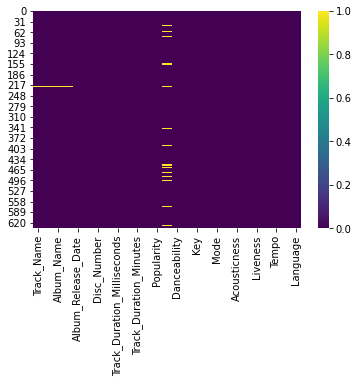

In [338]:
# Visualizing the missing values

sns.heatmap(devotional1.isnull(), cbar = "True", cmap = 'viridis')

In [339]:
devotional1.isnull().sum()

Track_Name                      2
Artist_Name                     2
Album_Name                      2
Album_Artist_Name               2
Album_Release_Date              0
Album_Release_Year              0
Disc_Number                     0
Track_Number                    0
Track_Duration_Milliseconds     0
Track_Duration_Seconds          0
Track_Duration_Minutes          0
Explicit                        0
Popularity                      0
Artist_Genres                  39
Danceability                    0
Energy                          0
Key                             0
Loudness                        0
Mode                            0
Speechiness                     0
Acousticness                    0
Instrumentalness                0
Liveness                        0
Valence                         0
Tempo                           0
Time_Signature                  0
Language                        0
dtype: int64

In [340]:
devotional1.isnull().values.any()

True

In [341]:
devotional1["Album_Name"].fillna("Unknown", inplace = True)

In [342]:
devotional1["Album_Release_Date"].fillna("0000-00-00", inplace = True)

In [343]:
devotional1["Album_Release_Year"].fillna("0000", inplace = True)

In [344]:
devotional1["Album_Artist_Name"].fillna("Unknown", inplace = True)

In [345]:
devotional1["Artist_Genres"].fillna("Unknown", inplace = True)

In [346]:
devotional1["Danceability"].fillna("0.0", inplace = True)

In [347]:
devotional1["Energy"].fillna("0.0", inplace = True)

In [348]:
devotional1["Key"].fillna("0.0", inplace = True)

In [349]:
devotional1["Loudness"].fillna("0.0", inplace = True)

In [350]:
devotional1["Mode"].fillna("0.0", inplace = True)

In [351]:
devotional1["Speechiness"].fillna("0.0", inplace = True)

In [352]:
devotional1["Acousticness"].fillna("0.0", inplace = True)

In [353]:
devotional1["Instrumentalness"].fillna("0.0", inplace = True)

In [354]:
devotional1["Liveness"].fillna("0.0", inplace = True)

In [355]:
devotional1["Valence"].fillna("0.0", inplace = True)

In [356]:
devotional1["Tempo"].fillna("0.0", inplace = True)

In [357]:
devotional1["Time_Signature"].fillna("0.0", inplace = True)

In [358]:
devotional1["Language"].fillna("Unknown", inplace = True)

In [359]:
# Dropping Track_Name missing values and Artist_Name becoz its of no use now

devotional1.dropna(subset=['Artist_Name'])

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1999,1,1,1301269,1301.269,...,-5.947,1,0.0541,0.7660,0.000000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,,1,3,407706,407.706,...,-15.063,0,0.0331,0.7280,0.000000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1997,1,12,89202,89.202,...,-8.058,1,0.0903,0.5360,0.007540,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,2006,1,13,237718,237.718,...,-7.138,0,0.0279,0.6720,0.000000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,2001,1,2,340656,340.656,...,-5.127,0,0.0856,0.1870,0.000000,0.7370,0.703,89.943,4,Telugu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632,Narayana Manthram,P. Susheela,Bhakta Prahalada,"S. Rajeswara Rao, S.N.Rajeswari Rao",31-12-1974,1974,1,1,202493,202.493,...,-4.290,1,0.0379,0.9390,0.229000,0.6070,0.561,79.362,4,Telugu
633,Sri Seetharamula Kalyanam,P. Susheela,Seetharama Kalyanam,Various Artists,31-12-1961,1961,1,4,349866,349.866,...,-12.154,0,0.0995,0.9400,0.820000,0.3890,0.856,156.954,4,Telugu
634,Dandakam,"Gangadhar Sastry, Gopichand",Nijam,R. P. Patnaik,23-05-2003,2003,1,5,112277,112.277,...,-5.045,1,0.1310,0.0204,0.000013,0.0889,0.570,91.486,3,Telugu
635,Deva Devam,Palakkad Shreeram|Rita,Attarrintiki Daaredi,Devi Sri Prasad,19-07-2013,2013,1,3,104504,104.504,...,-5.604,1,0.2190,0.4480,0.000000,0.1090,0.695,175.876,5,Telugu


In [360]:
devotional1.isnull().sum()

Track_Name                     2
Artist_Name                    2
Album_Name                     0
Album_Artist_Name              0
Album_Release_Date             0
Album_Release_Year             0
Disc_Number                    0
Track_Number                   0
Track_Duration_Milliseconds    0
Track_Duration_Seconds         0
Track_Duration_Minutes         0
Explicit                       0
Popularity                     0
Artist_Genres                  0
Danceability                   0
Energy                         0
Key                            0
Loudness                       0
Mode                           0
Speechiness                    0
Acousticness                   0
Instrumentalness               0
Liveness                       0
Valence                        0
Tempo                          0
Time_Signature                 0
Language                       0
dtype: int64

In [361]:
devotional1.isnull().sum().sum()

4

In [362]:
nan_rows = devotional1[devotional1['Track_Name'].isnull()]
nan_rows

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
222,NaN,NaN,Unknown,Unknown,01-04-2002,2002,1,3,609802,609.802,...,-9.792,0,0.0299,0.887,0.0,0.0613,0.767,85.682,4,Telugu
223,NaN,NaN,Unknown,Unknown,01-04-2002,2002,1,2,770063,770.063,...,-12.015,1,0.2750,0.769,0.0,0.3710,0.936,152.705,3,Telugu


In [364]:
devotional1.drop([222, 223], axis=0, inplace = True)

In [365]:
devotional1.isnull().sum()

Track_Name                     0
Artist_Name                    0
Album_Name                     0
Album_Artist_Name              0
Album_Release_Date             0
Album_Release_Year             0
Disc_Number                    0
Track_Number                   0
Track_Duration_Milliseconds    0
Track_Duration_Seconds         0
Track_Duration_Minutes         0
Explicit                       0
Popularity                     0
Artist_Genres                  0
Danceability                   0
Energy                         0
Key                            0
Loudness                       0
Mode                           0
Speechiness                    0
Acousticness                   0
Instrumentalness               0
Liveness                       0
Valence                        0
Tempo                          0
Time_Signature                 0
Language                       0
dtype: int64

In [366]:
devotional1.isnull().sum().sum()

0

In [367]:
nan_rows = devotional1[devotional1['Artist_Name'].isnull()]
nan_rows

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language


In [368]:
devotional1.drop([3801, 3806], axis=0, inplace = True)

KeyError: '[3801 3806] not found in axis'

In [369]:
devotional1.isnull().sum().sum()

0

In [370]:
devotional1.isnull().sum()

Track_Name                     0
Artist_Name                    0
Album_Name                     0
Album_Artist_Name              0
Album_Release_Date             0
Album_Release_Year             0
Disc_Number                    0
Track_Number                   0
Track_Duration_Milliseconds    0
Track_Duration_Seconds         0
Track_Duration_Minutes         0
Explicit                       0
Popularity                     0
Artist_Genres                  0
Danceability                   0
Energy                         0
Key                            0
Loudness                       0
Mode                           0
Speechiness                    0
Acousticness                   0
Instrumentalness               0
Liveness                       0
Valence                        0
Tempo                          0
Time_Signature                 0
Language                       0
dtype: int64

In [371]:
devotional1.shape

(635, 27)

### Checking and Removing Duplicate values()

In [372]:
devotional1.duplicated().sum()

1

In [373]:
devotional1.drop_duplicates(inplace = True)

In [374]:
devotional1.shape

(634, 27)

In [375]:
devotional1.duplicated().sum()

0

### Saving Dataset 

In [376]:
devotional1.to_csv('telugu_devotional_songs_new.csv',index = False)

In [377]:
devotional1_new = pd.read_csv('telugu_devotional_songs_new.csv')

In [378]:
devotional1_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1999.0,1,1,1301269,1301.269,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,NaN,1,3,407706,407.706,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1997.0,1,12,89202,89.202,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,2006.0,1,13,237718,237.718,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,2001.0,1,2,340656,340.656,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


In [379]:
devotional1_new.shape

(634, 27)

## Analyzing Data

### Hindi Songs

In [3]:
devo1_new = pd.read_csv('hindi_devotional_songs_new.csv')

In [4]:
devo1_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Namo Namo,Amit Trivedi,Kedarnath,Amit Trivedi,27-11-2018,2018,1,1,322250,322.250,...,-6.216,1,0.0304,0.436,0.000000,0.1210,0.330,119.935,4,Hindi
1,Shree Hanuman Chalisa,Hariharan,Shree Hanuman Chalisa (Hanuman Ashtak),Hariharan,01-01-1992,1992,1,1,586075,586.075,...,-3.400,1,0.0350,0.545,0.000000,0.1320,0.831,91.010,4,Hindi
2,Achutam Keshavam,Vikram Hazra,Amrit,Vikram Hazra,01-01-2008,2008,1,1,348333,348.333,...,-11.508,1,0.0439,0.218,0.000000,0.0797,0.661,92.521,4,Hindi
3,Achyutam Keshavam,Shreya Ghoshal,Achyutam Keshavam,Shreya Ghoshal,07-08-2019,2019,1,1,279754,279.754,...,-13.165,1,0.1240,0.656,0.000151,0.1600,0.165,85.047,4,Hindi
4,Shendur Laal Chadhayo (Aarti),Ravindra Sathe,Vaastav: The Reality,"Jatin-Lalit, Rahul Ranade",28-08-1999,1999,1,6,194253,194.253,...,-12.760,1,0.0648,0.549,0.000115,0.4280,0.722,125.518,4,Hindi


In [5]:
devo1_new.shape

(1056, 27)

In [51]:
devo1_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

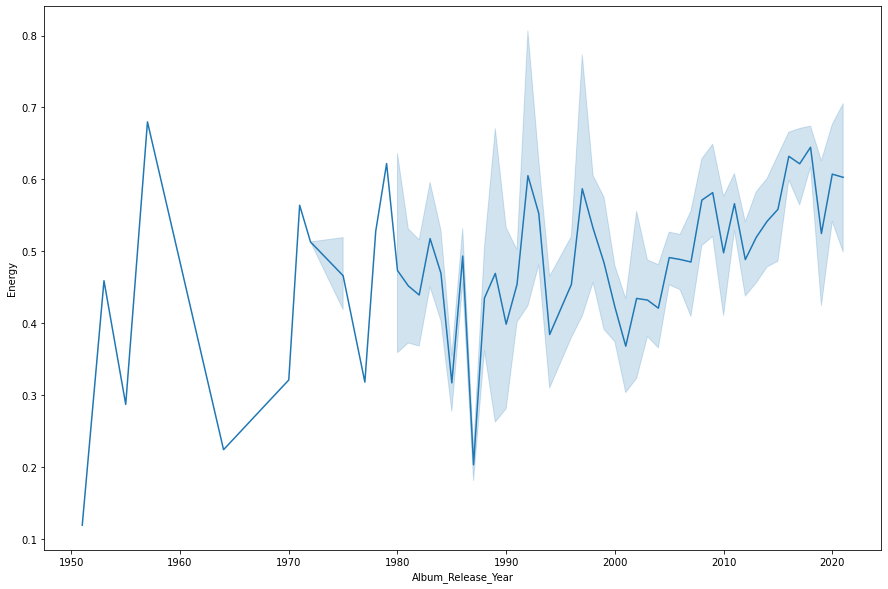

In [52]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo1_new, ax=ax )

There is an increase in Energy after 1975

###### Acousticness Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

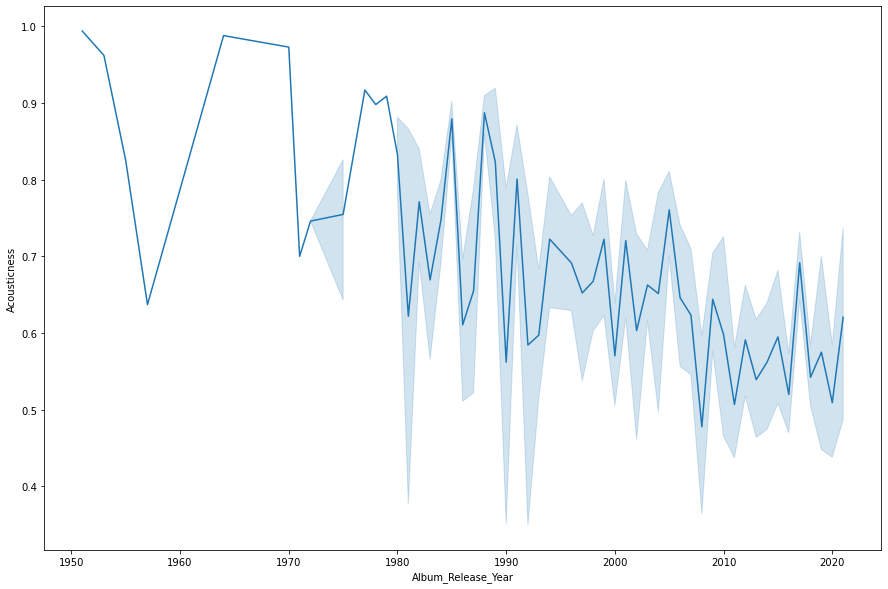

In [53]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo1_new, ax=ax )

There is an decrease in Acousticness after 1970

###### Which songs has most popularities?

In [174]:
highest_rated_songs1 = devo1_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs1

0      71
28     70
493    70
483    69
485    68
Name: Popularity, dtype: int64

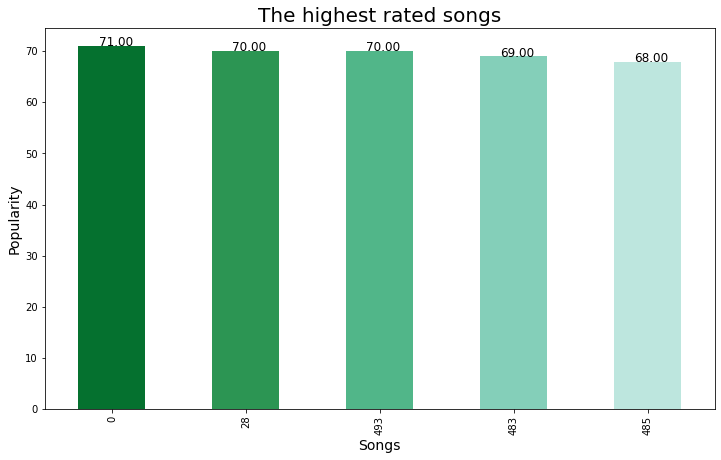

In [175]:
highest_rated_songs1.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs1.index):
    plt.text(x=x-0.1,y=highest_rated_songs1.loc[index],s='{:.2f}'.format(highest_rated_songs1.loc[index]),fontsize=12)


In [6]:
top10_songs = devo1_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [176]:
lowest_rated_songs1 = devo1_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs1

412    0
973    0
972    0
971    0
970    0
Name: Popularity, dtype: int64

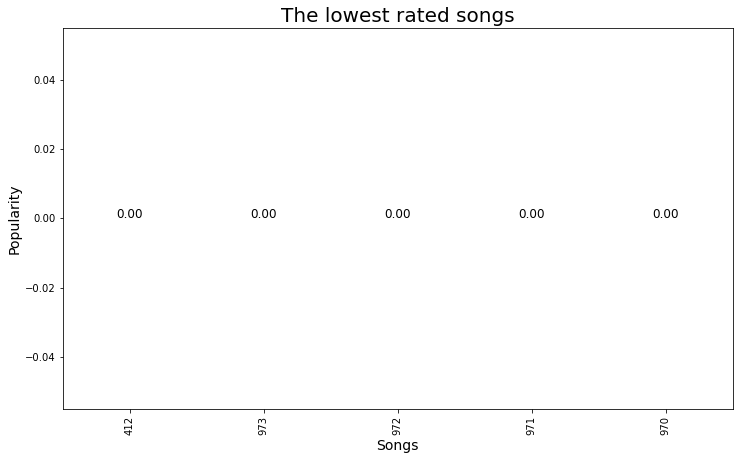

In [177]:
lowest_rated_songs1.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs1.index):
    plt.text(x=x-0.1,y=lowest_rated_songs1.loc[index],s='{:.2f}'.format(lowest_rated_songs1.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [277]:
top_artists = devo1_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [278]:
top_artists

Artist_Name                                 
Anup Jalota                                     267
Jagjit Singh                                    182
Anuradha Paudwal                                 34
Jagjit Singh, Chitra Singh                       27
Lakhbir Singh Lakkha                             26
                                               ... 
Kavita Krishnamurthy, Hemlata, Ravindra Jain      1
Kavita Krishnamurthy, Shreya Ghoshal, KK          1
Kedar Pandit                                      1
Ketan Patwardhan                                  1
Wah!                                              1
Length: 283, dtype: int64

In [281]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

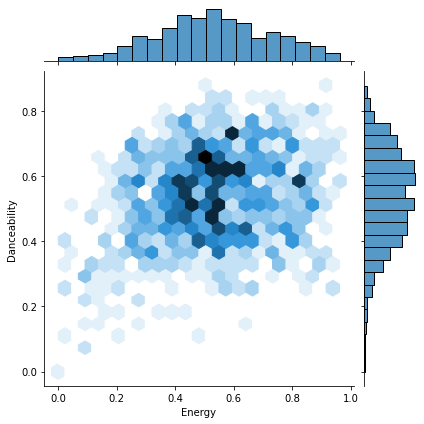

In [128]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo1_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.6 index while most songs have danceability between 0.4 to 0.7.

###### Who makes the most “Danceable” music?

In [129]:
devo1_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
449,"A.R. Rahman, Shreya Ghoshal, Uday Mazumdar",0.879
390,Hansraj Raghuwanshi,0.872
664,Jagjit Singh,0.843
669,Jagjit Singh,0.842
878,Anup Jalota,0.841
621,"Jagjit Singh, Various Artists",0.839
848,Anup Jalota,0.834
678,Jagjit Singh,0.828
206,"Kailash Kher, Paresh Kamath, Naresh Kamath",0.825
12,Suresh Wadkar,0.825


###### Most Popular Genres

In [132]:
devo1_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
0,"desi pop,filmi,modern bollywood",71
28,"desi pop,filmi,modern bollywood,desi hip hop,d...",70
493,"classic bollywood,desi pop,filmi,modern bollyw...",70
483,"desi pop,filmi,modern bollywood,filmi,marathi ...",69
485,"desi pop,filmi,modern bollywood,desi hip hop,d...",68
491,"desi pop,filmi,modern bollywood,desi pop,filmi...",66
1,"filmi,ghazal,tamil pop",64
234,"kirtan,meditation,shamanic",61
484,"desi hip hop,desi pop,filmi,indian folk,modern...",61
723,"classic bollywood,desi pop,filmi,ghazal,sufi",60


In [7]:
top10_genres = devo1_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Marathi Songs

In [8]:
devo2_new = pd.read_csv('marathi_devotional_songs_new.csv')

In [9]:
devo2_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Vithu Mauli Tu Mauli Jagachi,"Sudhir Waghmode, Lamrud Padmaja",Vithu Mauli Tu Mauli Jagachi,"Sudhir Waghmode, Lamrud Padmaja",10-02-2020,2020,1,1,322664,322.664,...,-1.139,1,0.0509,0.2900,0.000000,0.1970,0.523,169.759,4,Marathi
1,Vitthal Vitthal Vitthalla,Adarsh Shinde,Thank U Vithalla,Rohan Rohan,11-10-2017,2017,1,2,247902,247.902,...,-6.093,1,0.0673,0.0573,0.000000,0.0894,0.630,102.997,4,Marathi
2,Runu Jhunu Runu Jhunu Re Bhramara,Lata Mangeshkar,Dnyaneshwar Mauli,Lata Mangeshkar,01-02-1961,1961,1,2,238346,238.346,...,-11.689,1,0.0331,0.9570,0.001110,0.1740,0.415,132.452,3,Marathi
3,Aaji Soniyacha Dinu,Lata Mangeshkar,Dnyaneshwar Mauli,Lata Mangeshkar,01-02-1961,1961,1,1,222640,222.640,...,-10.428,1,0.0360,0.9330,0.000072,0.4840,0.551,84.841,4,Marathi
4,Pratham Tula Vandito,"Vasantrao Deshpande, Anuradha Paudwal",Ashtavinayak (Original Motion Picture Soundtrack),Anil-Arun,01-12-1979,1979,1,4,373560,373.560,...,-12.290,1,0.0374,0.9840,0.000668,0.2160,0.667,76.526,4,Marathi


In [10]:
devo2_new.shape

(804, 27)

In [139]:
devo2_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

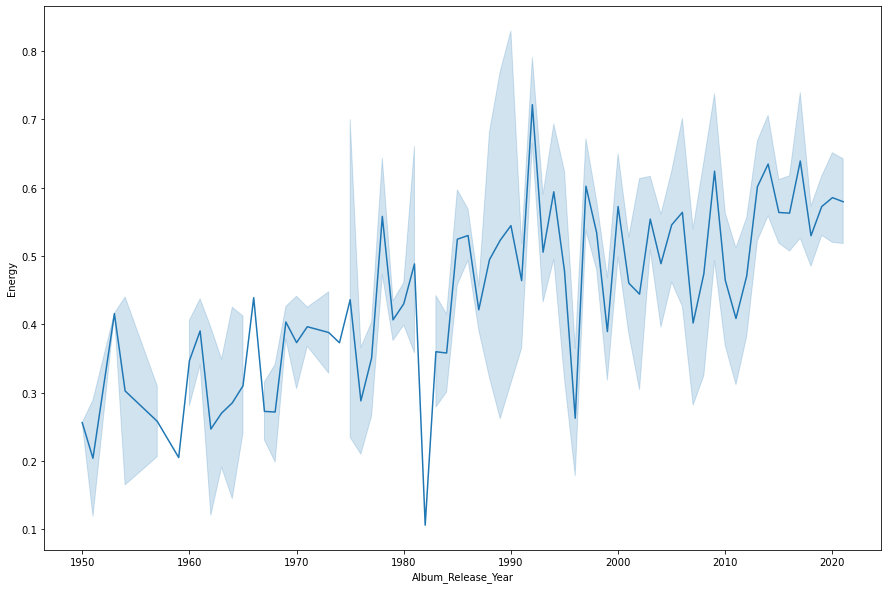

In [140]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo2_new, ax=ax )

There is an increase in Energy after 1980

###### Acousticness Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

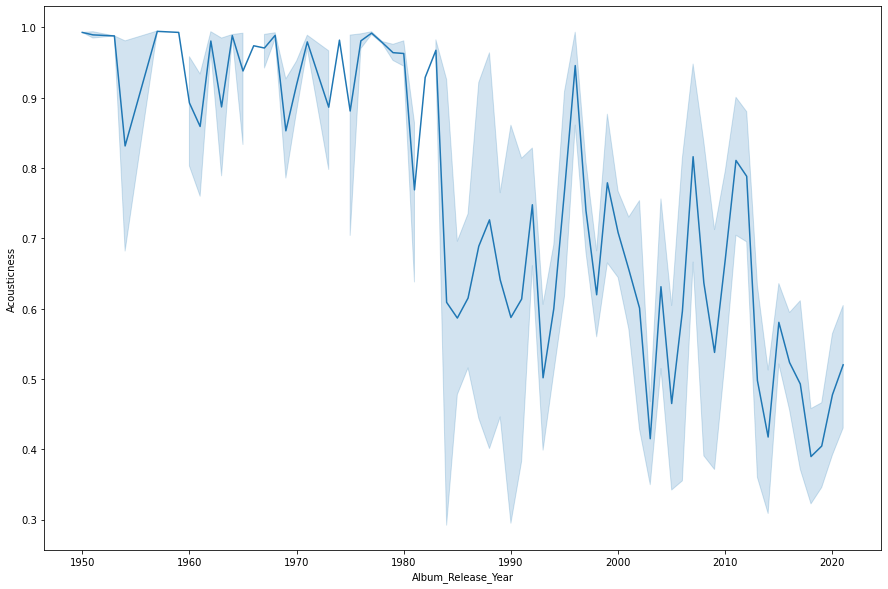

In [141]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo2_new, ax=ax )

There is an decrease in Acousticness after 1980

###### Which songs has most popularities?

In [172]:
highest_rated_songs2 = devo2_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs2

126    71
372    64
677    58
683    58
122    57
Name: Popularity, dtype: int64

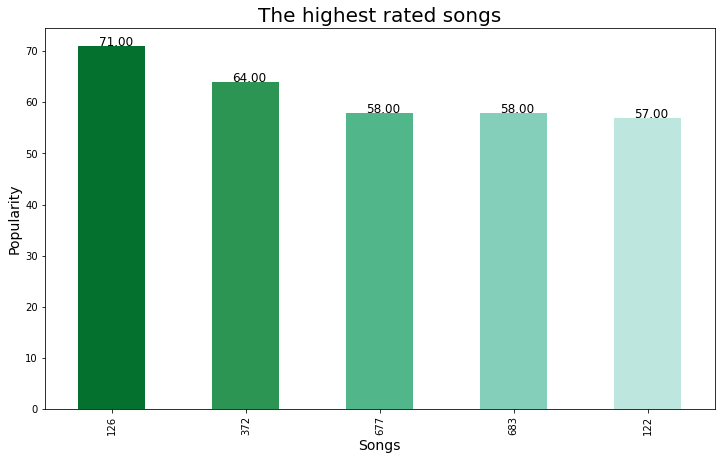

In [173]:
highest_rated_songs2.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs2.index):
    plt.text(x=x-0.1,y=highest_rated_songs2.loc[index],s='{:.2f}'.format(highest_rated_songs2.loc[index]),fontsize=12)


In [11]:
top10_songs = devo2_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [179]:
lowest_rated_songs2 = devo2_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs2

803    0
680    0
678    0
676    0
263    0
Name: Popularity, dtype: int64

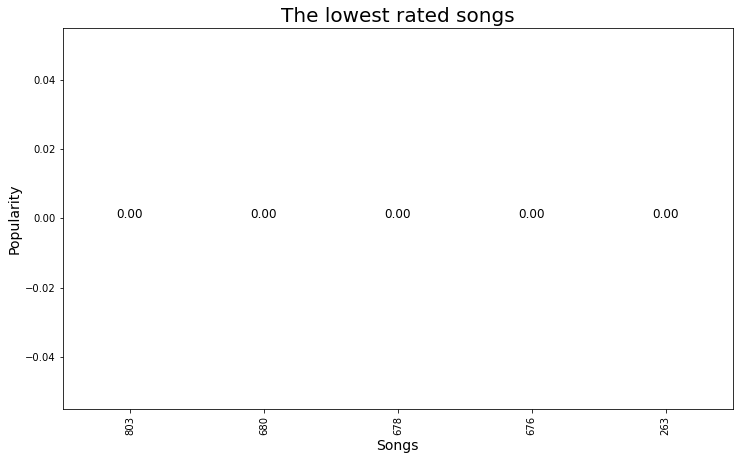

In [181]:
lowest_rated_songs2.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs2.index):
    plt.text(x=x-0.1,y=lowest_rated_songs2.loc[index],s='{:.2f}'.format(lowest_rated_songs2.loc[index]),fontsize=12)


###### Which artist has worked on most songs?

In [274]:
top_artists = devo2_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [275]:
top_artists

Artist_Name                   
Lata Mangeshkar                   65
Suresh Wadkar                     53
Ajit Kadkade                      38
Sudhir Phadke                     35
Anuradha Paudwal                  33
                                  ..
Mohammed Rafi, Lata Mangeshkar     1
Naim Sabri                         1
Neha Rajpal                        1
Nihar Mayekar                      1
Zubeen Garg                        1
Length: 257, dtype: int64

In [276]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

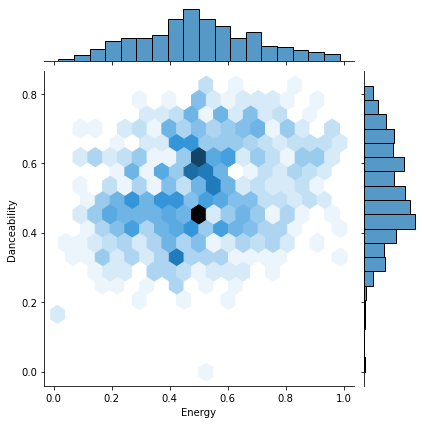

In [155]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo2_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.6 index while numbers of songs have danceability between 0.4 to 0.6.

###### Who makes the most “Danceable” music?

In [156]:
devo1_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
449,"A.R. Rahman, Shreya Ghoshal, Uday Mazumdar",0.879
390,Hansraj Raghuwanshi,0.872
664,Jagjit Singh,0.843
669,Jagjit Singh,0.842
878,Anup Jalota,0.841
621,"Jagjit Singh, Various Artists",0.839
848,Anup Jalota,0.834
678,Jagjit Singh,0.828
206,"Kailash Kher, Paresh Kamath, Naresh Kamath",0.825
12,Suresh Wadkar,0.825


###### Most Popular Genres

In [157]:
devo1_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
0,"desi pop,filmi,modern bollywood",71
28,"desi pop,filmi,modern bollywood,desi hip hop,d...",70
493,"classic bollywood,desi pop,filmi,modern bollyw...",70
483,"desi pop,filmi,modern bollywood,filmi,marathi ...",69
485,"desi pop,filmi,modern bollywood,desi hip hop,d...",68
491,"desi pop,filmi,modern bollywood,desi pop,filmi...",66
1,"filmi,ghazal,tamil pop",64
234,"kirtan,meditation,shamanic",61
484,"desi hip hop,desi pop,filmi,indian folk,modern...",61
723,"classic bollywood,desi pop,filmi,ghazal,sufi",60


In [12]:
top10_genres = devo2_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Gujarati Songs

In [13]:
devo3_new = pd.read_csv('gujarati_devotional_songs_new.csv')

In [14]:
devo3_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Aarti Utaro Maa Ni Aarti Utaro (Khodiyar Aarti),"Mahendra Kapoor, Usha Mangeshkar",Aarti Sangrah (Gujrati),Various Artists,21-04-2021,2021,1,2,397057,397.057,...,-5.052,1,0.0568,0.662,0.000145,0.2080,0.651,95.063,4,Gujarati
1,Khodiyar Che Jogmaya,"Arvind Barot, Bhavna Rana",Khodiyar Che Jogmaya,"Arvind Barot, Bhavna Rana",05-04-2008,2008,1,1,484780,484.780,...,-7.660,0,0.0534,0.655,0.000171,0.2700,0.787,147.849,3,Gujarati
2,Khodiyar Chalisa,Hemant Chauhan,Khodiyar Amritwani,Hemant Chauhan,11-11-1999,1999,1,1,856702,856.702,...,-11.184,1,0.0420,0.888,0.000000,0.2030,0.845,139.370,4,Gujarati
3,Khodiyar Chalisa,Hemant Chauhan,Khodiyar Chalisa,"Hemant Chauhan, Damyanti Barot",09-09-2012,2012,1,1,730827,730.827,...,-10.484,1,0.0416,0.363,0.000000,0.0724,0.783,72.002,4,Gujarati
4,Khodiyar Maa No Mantra,Hemant Chauhan,Khodiyar Chalisa,"Hemant Chauhan, Damyanti Barot",09-09-2012,2012,1,4,198269,198.269,...,-9.227,1,0.0294,0.657,0.000000,0.1130,0.823,115.977,4,Gujarati


In [15]:
devo3_new.shape

(829, 27)

In [163]:
devo3_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

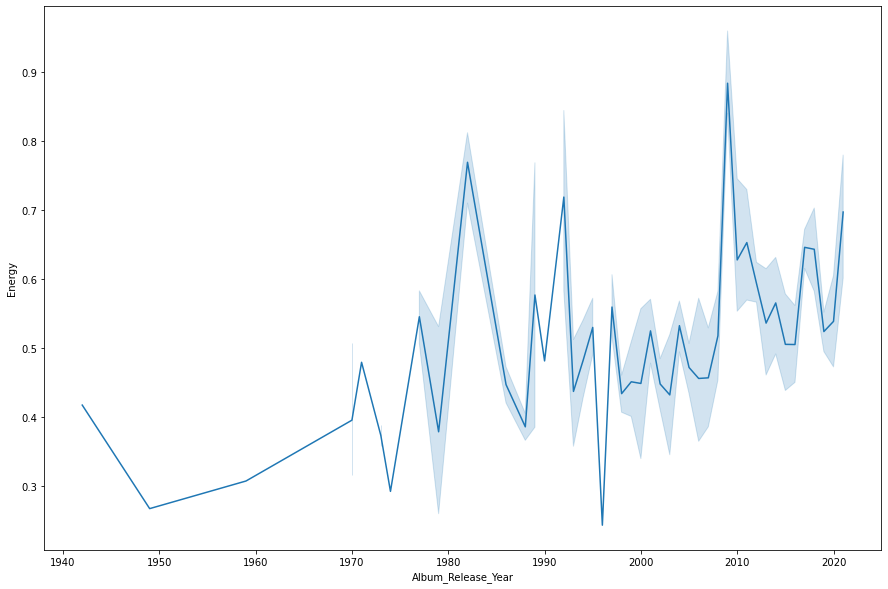

In [164]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo3_new, ax=ax )

There is an increase in Energy after 1970

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

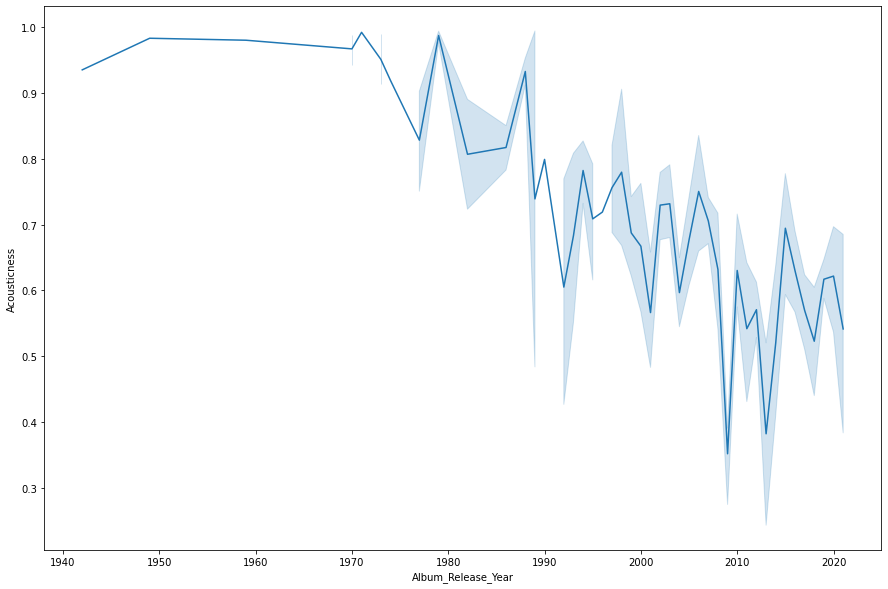

In [165]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo3_new, ax=ax )

There is an decrease in Acousticness after 1965

###### Which songs has most popularities?

In [168]:
highest_rated_songs3 = devo3_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs3

189    64
377    64
375    62
358    60
579    58
Name: Popularity, dtype: int64

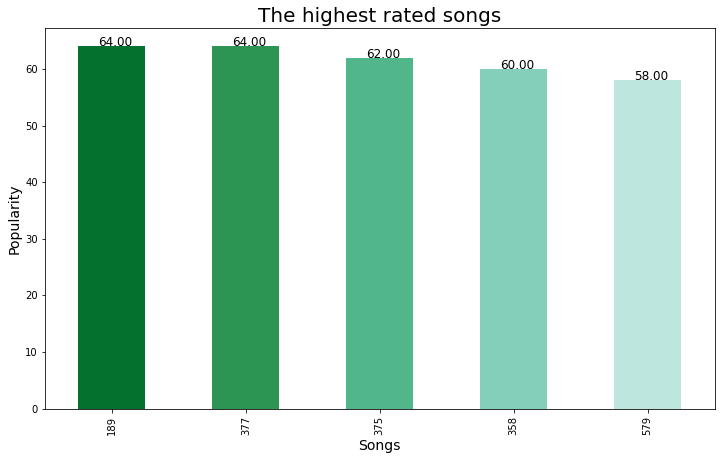

In [169]:
highest_rated_songs3.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs3.index):
    plt.text(x=x-0.1,y=highest_rated_songs3.loc[index],s='{:.2f}'.format(highest_rated_songs3.loc[index]),fontsize=12)


In [16]:
top10_songs = devo3_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [204]:
lowest_rated_songs3 = devo3_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs3

447    0
421    0
827    0
818    0
169    0
Name: Popularity, dtype: int64

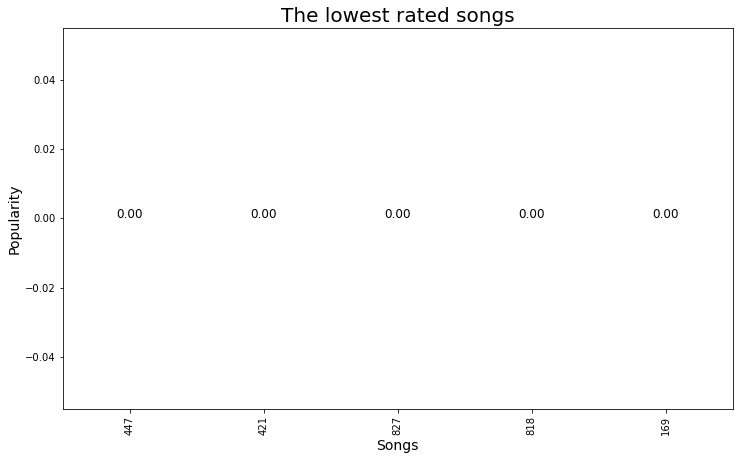

In [205]:
lowest_rated_songs3.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs3.index):
    plt.text(x=x-0.1,y=lowest_rated_songs3.loc[index],s='{:.2f}'.format(lowest_rated_songs3.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [282]:
top_artists = devo3_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [283]:
top_artists

Artist_Name                                         
Hemant Chauhan                                          98
Manhar Udhas                                            39
Narsinh Mehta                                           28
Ashit Desai, Hema Desai                                 22
Anuradha Paudwal                                        18
                                                        ..
Dev Bhatt, Pamela Jain                                   1
Dev Bhatt, Kishor Manaraja                               1
Dev Bhatt, Kirtidan Gadhvi                               1
Nitin Devka, Urvashi Pandya, Ami Chavda, Asif Jeriya     1
A.R. Rahman, Ajay Chakraborthy, Kaushiki Chakraborty     1
Length: 255, dtype: int64

In [284]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

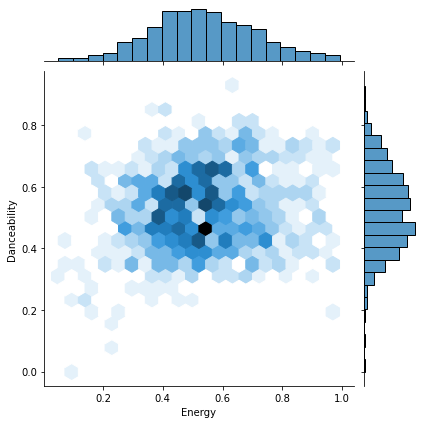

In [189]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo3_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.6 index while most numbers of songs have danceability between 0.4 to 0.6.

###### Who makes the most “Danceable” music?

In [190]:
devo3_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
401,"Badshah, Bhoomi Trivedi",0.928
668,"Dipali\, Sachin\, Foram\, Shashank",0.870
646,"Shailendra Bharti, Nisha Upadhyay",0.841
670,"Dipali\, Sachin\, Foram\, Shashank",0.837
96,Urvashi Pandya,0.831
218,Shankar Sahney,0.822
472,Vandana Bhardwaj,0.814
110,"Asif Jeriya, Meenakshi Vadher",0.806
338,Kabir Cafe,0.797
642,"Shailendra Bharti, Nisha Upadhyay",0.793


###### Most Popular Genres

In [191]:
devo3_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
189,"filmi,ghazal,tamil pop",64
377,"desi pop,gujarati pop,modern bollywood,desi po...",64
375,"desi pop,gujarati pop,modern bollywood",62
358,"desi pop,filmi,gujarati pop,modern bollywood,d...",60
579,"desi pop,filmi,modern bollywood",58
190,"filmi,ghazal,tamil pop",53
325,"bhajan,gujarati garba",52
246,"desi pop,filmi,modern bollywood,gujarati garba...",52
324,"bhajan,gujarati garba",52
191,"filmi,ghazal,tamil pop",51


In [17]:
top10_genres = devo3_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Punjabi Songs

In [18]:
devo4_new = pd.read_csv('punjabi_devotional_songs_new.csv')

In [19]:
devo4_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Satgur Pyare,"Sunidhi Chauhan, Devenderpal Singh",Ardaas Karaan,"Gippy Grewal, Jatinder Shah",10-08-2019,2019,1,1,284745,284.745,...,-8.745,0,0.0422,0.343,0.000380,0.111,0.317,139.981,4,Punjabi
1,Ardaas,Hardeep Grewal,Ardaas,Hardeep Grewal,24-09-2018,2018,1,1,278882,278.882,...,-5.768,0,0.0496,0.738,0.000000,0.213,0.604,83.506,4,Punjabi
2,Nanak Aadh Jugaadh Jiyo,Diljit Dosanjh,Nanak Aadh Jugaadh Jiyo,Diljit Dosanjh,10-11-2019,2019,1,1,279207,279.207,...,-4.648,0,0.0411,0.687,0.000000,0.099,0.592,143.893,4,Punjabi
3,Aar Nanak Paar Nanak,Diljit Dosanjh,Aar Nanak Paar Nanak,Diljit Dosanjh,19-11-2018,2018,1,1,278785,278.785,...,-5.688,0,0.0460,0.769,0.000016,0.101,0.389,139.803,4,Punjabi
4,Satnam Waheguru,Prabh Gill,Satnam Waheguru,Prabh Gill,20-01-2019,2019,1,1,260785,260.785,...,-6.987,1,0.0449,0.702,0.000000,0.178,0.379,134.225,4,Punjabi


In [20]:
devo4_new.shape

(974, 27)

In [195]:
devo4_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

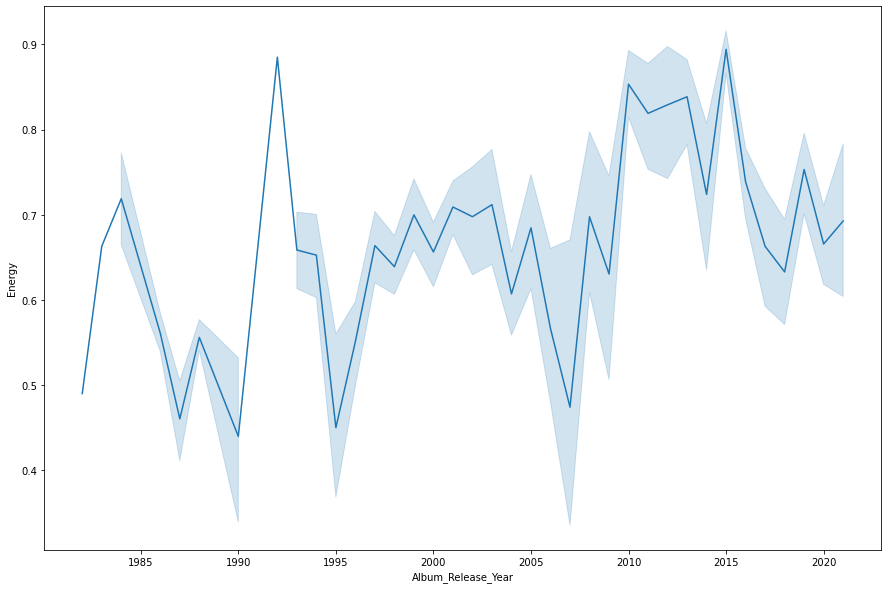

In [197]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo4_new, ax=ax )

There is an increase in Energy after 1990

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

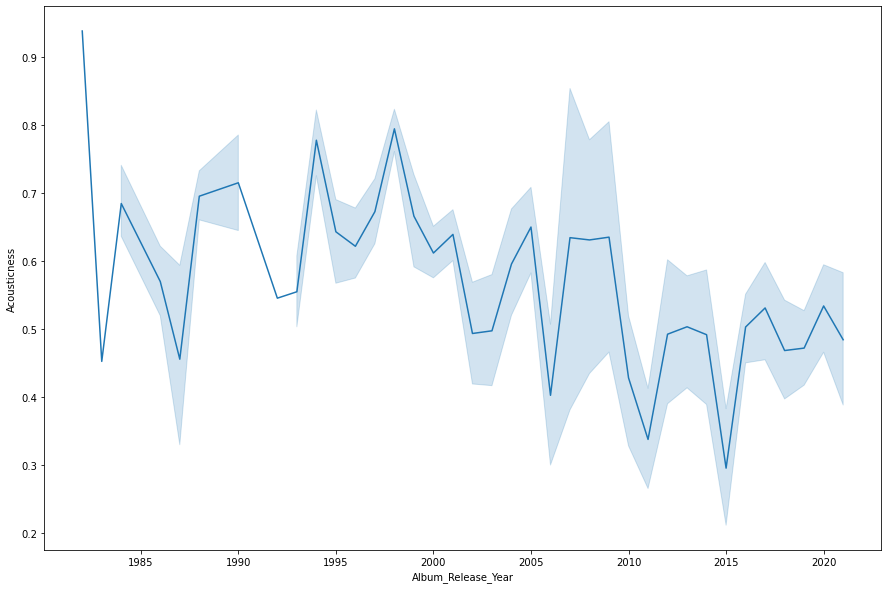

In [198]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo4_new, ax=ax )

There is an decrease in Acousticness after 2000

###### Which songs has most popularities?

In [200]:
highest_rated_songs4 = devo4_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs4

43     64
3      53
44     50
496    50
10     49
Name: Popularity, dtype: int64

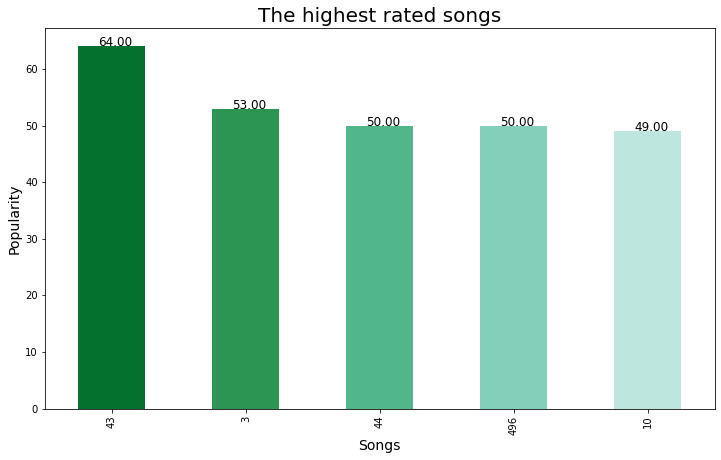

In [201]:
highest_rated_songs4.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs4.index):
    plt.text(x=x-0.1,y=highest_rated_songs4.loc[index],s='{:.2f}'.format(highest_rated_songs4.loc[index]),fontsize=12)


In [21]:
top10_songs = devo4_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [202]:
lowest_rated_songs4 = devo4_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs4

486    0
499    0
501    0
502    0
503    0
Name: Popularity, dtype: int64

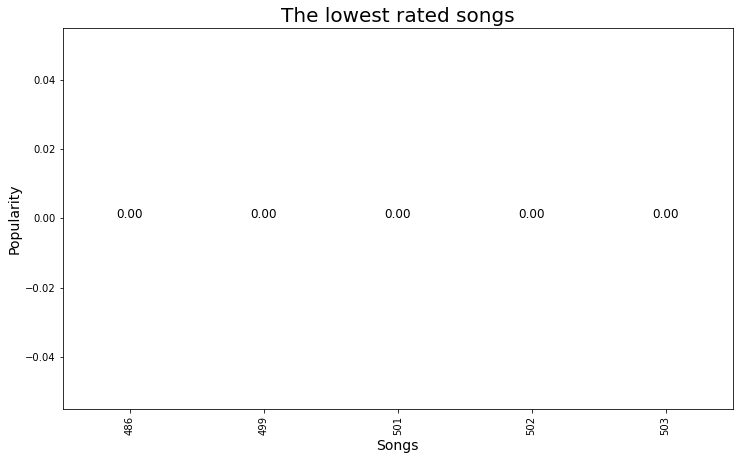

In [203]:
lowest_rated_songs4.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs4.index):
    plt.text(x=x-0.1,y=lowest_rated_songs4.loc[index],s='{:.2f}'.format(lowest_rated_songs4.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [285]:
top_artists = devo4_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [286]:
top_artists

Artist_Name                          
Narendra Chanchal                        365
Sonu Nigam                               111
Sardool Sikander                          46
Lakhbir Singh Lakkha                      33
Mahendra Kapoor                           28
                                        ... 
Ekjoth                                     1
Diljit Dosanjh, Joy Atul, Dharam Seva      1
Dhadi Tarsem Singh Moranwali               1
Devenderpal Singh                          1
Yaqoub Pasha                               1
Length: 174, dtype: int64

In [287]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

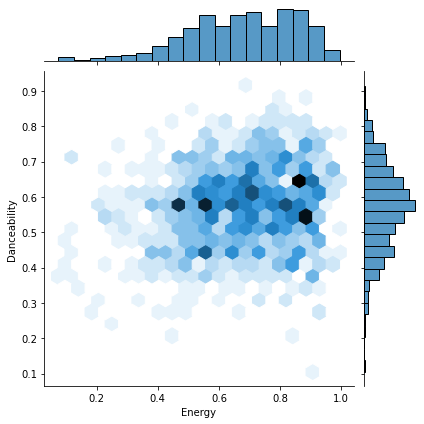

In [288]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo4_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.7 index while most numbers of songs have danceability between 0.4 to 0.8.

###### Who makes the most “Danceable” music?

In [289]:
devo4_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
792,Sonu Nigam,0.915
20,Tarsem Jassar,0.878
844,Sardool Sikander,0.870
563,Narendra Chanchal,0.856
95,Jagjit Singh,0.843
317,Narendra Chanchal,0.842
564,Narendra Chanchal,0.835
769,Sonu Nigam,0.827
636,Udit Narayan,0.826
209,Lakhbir Singh Lakkha,0.819


###### Most Popular Genres

In [290]:
devo4_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
43,"filmi,ghazal,tamil pop",64
3,"desi pop,filmi,modern bollywood,punjabi pop",53
44,"bhajan,classic bollywood,desi pop,filmi,ghazal...",50
496,"desi pop,filmi,modern bollywood",50
10,"desi pop,filmi,modern bollywood,punjabi pop",49
65,"desi pop,filmi,modern bollywood,punjabi pop",49
110,"desi pop,filmi,modern bollywood,desi pop,filmi...",48
2,"desi pop,filmi,modern bollywood,punjabi pop",48
20,"desi hip hop,desi pop,punjabi pop",48
239,bhajan,46


In [22]:
top10_genres = devo4_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Sanskrit Songs

In [23]:
devo5_new = pd.read_csv('sanskrit_devotional_songs_new.csv')

In [24]:
devo5_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1999,1,1,1301269,1301.269,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Sanskrit
1,Namah Suryaya,Anuradha Bhat,Stotra Samputam,Anuradha Bhat,2016,2016,1,3,775573,775.573,...,-7.949,1,0.0467,0.477,0.00000,0.1510,0.923,150.559,4,Sanskrit
2,Shri Ganesh Mantra (Om Gam Ganpataye Namo Namah),Ritu,Shri Ganesh Mantra (Om Gam Ganpataye Namo Nama...,Ritu,11-07-2020,2020,1,1,655760,655.760,...,-13.227,1,0.0458,0.723,0.00000,0.1130,0.480,75.237,1,Sanskrit
3,Maha Mrityunjaya Mantra Om Tryambakam Yajamahe...,Suresh Wadkar,Divine Chants from Incredible India Mantras Dh...,Various Artists,15-07-2014,2014,1,5,312440,312.440,...,-10.307,1,0.0401,0.891,0.00149,0.0902,0.392,159.764,1,Sanskrit
4,Shiva Shirasanamami,S. P. Balasubrahmanyam,Lord Shiva,"S. P. Balasubrahmanyam, G. V. Atri, Ajay Warriar",28-07-2016,2016,1,13,1188868,1188.868,...,-6.451,1,0.0706,0.349,0.00000,0.2730,0.963,172.027,4,Sanskrit


In [25]:
devo5_new.shape

(845, 27)

In [295]:
devo5_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

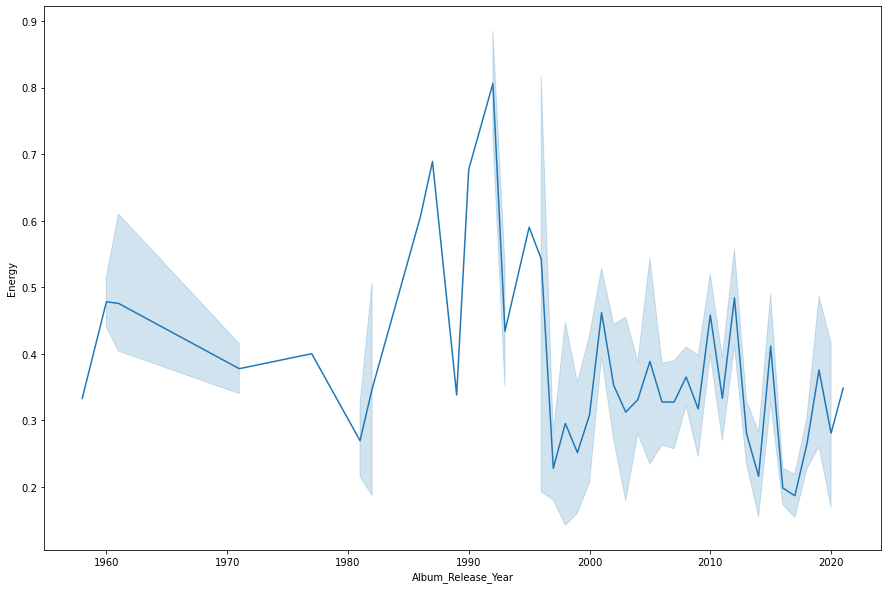

In [297]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo5_new, ax=ax )

There was an increase in Energy between 1980 to 1995

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

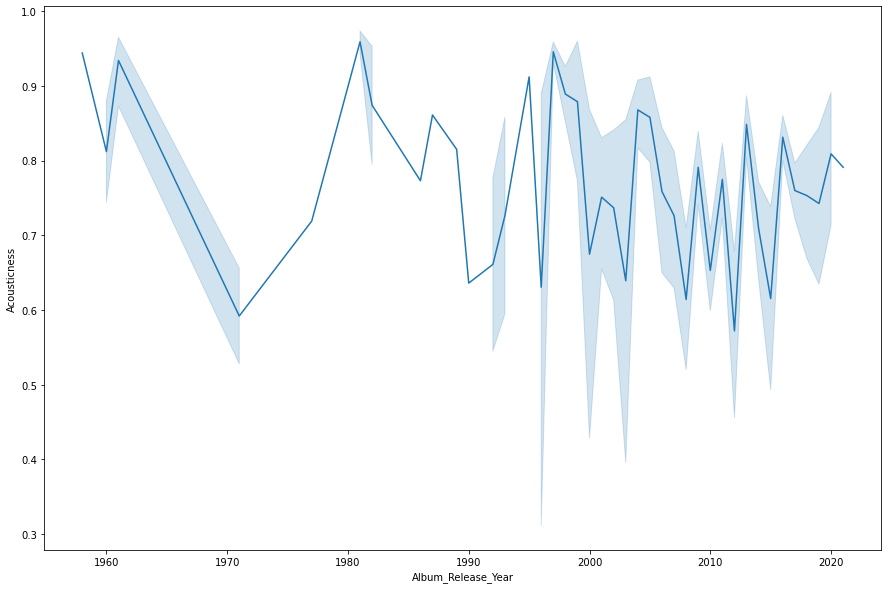

In [299]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo5_new, ax=ax )

There is an consistency in Acousticness 

###### Which songs has most popularities?

In [301]:
highest_rated_songs5 = devo5_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs5

829    64
540    64
359    61
825    60
747    58
Name: Popularity, dtype: int64

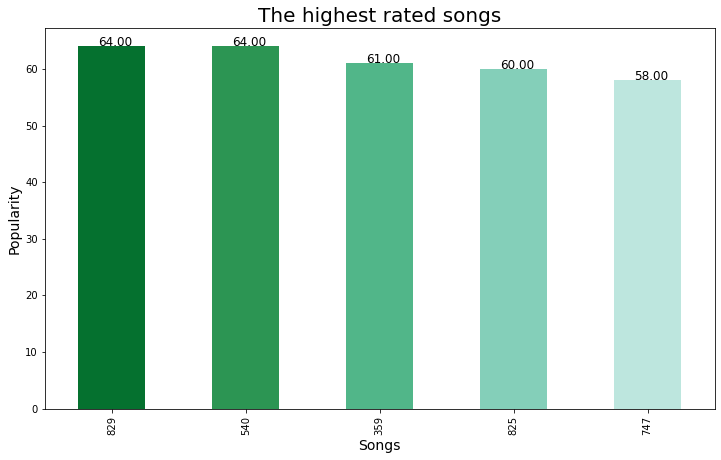

In [302]:
highest_rated_songs5.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs5.index):
    plt.text(x=x-0.1,y=highest_rated_songs5.loc[index],s='{:.2f}'.format(highest_rated_songs5.loc[index]),fontsize=12)


In [26]:
top10_songs = devo5_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [303]:
lowest_rated_songs5 = devo5_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs5

586    0
305    0
304    0
303    0
302    0
Name: Popularity, dtype: int64

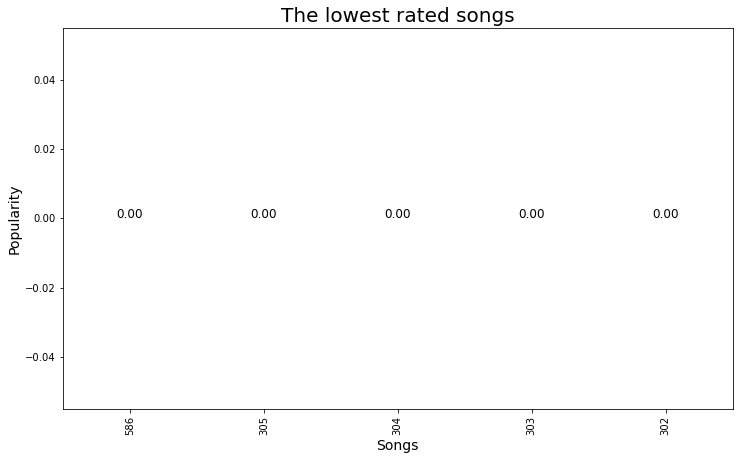

In [304]:
lowest_rated_songs5.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs5.index):
    plt.text(x=x-0.1,y=lowest_rated_songs5.loc[index],s='{:.2f}'.format(lowest_rated_songs5.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [305]:
top_artists = devo5_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [306]:
top_artists

Artist_Name                      
Mantrapoly                           175
Deva Premal                           60
Deva Premal, Miten                    38
Mahakatha                             32
Ravi Shankar                          27
                                    ... 
Mambalam Sisters, Gopika Poornima      1
Mani Venkat                            1
Mike Cohen                             1
Minakshi Majumdar                      1
silki agrawal                          1
Length: 212, dtype: int64

In [307]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

C:\Users\D_R\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

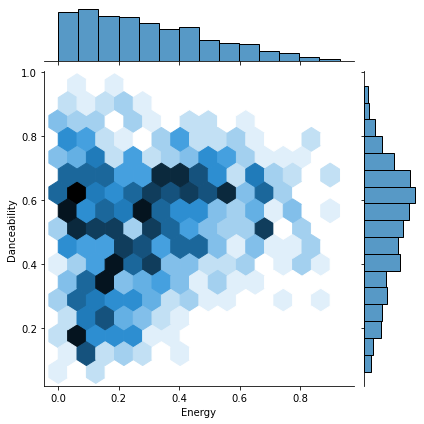

In [308]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo5_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.0 to 0.5 index while most numbers of songs have danceability between 0.1 to 0.7.

###### Who makes the most “Danceable” music?

In [312]:
devo5_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
548,Mantrapoly,0.958
734,Mantrapoly,0.933
743,Mantrapoly,0.916
705,Lotus Seed,0.915
618,Mantrapoly,0.914
650,Mantrapoly,0.914
724,Mantrapoly,0.906
687,Mantrapoly,0.891
673,Mantrapoly,0.888
712,Lotus Seed,0.885


###### Most Popular Genres

In [313]:
devo5_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
829,"filmi,ghazal,tamil pop",64
540,"electropop,indie poptimism,pop,pop rock",64
359,"kirtan,meditation,shamanic",61
825,kirtan,60
747,"healing,kirtan,kundalini,meditation,shamanic",58
408,"desi hip hop,desi pop,filmi,modern bollywood",56
748,"healing,kirtan,kundalini,meditation,shamanic",56
781,"kirtan,shamanic,world devotional",56
805,"healing,kirtan,meditation,shamanic",56
246,"kirtan,mantra",55


In [27]:
top10_genres = devo5_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Tamil Songs

In [28]:
devo6_new = pd.read_csv('tamil_devotional_songs_new.csv')

In [29]:
devo6_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Vinayagar Agaval,Bombay Sisters,Vinayagar Chathurti - Celebrations in Songs,"Bombay Sisters, Mahanadhi Shobana, Pushpavanam...",27-07-2017,2017,1,8,667186,667.186,...,-6.487,1,0.0403,0.848,0.0,0.3270,0.733,96.850,4,Tamil
1,Sri Venkateshwara Suprabhatham,M. S. Subbulakshmi,Sri Venkateshwara Suprabhatham,M. S. Subbulakshmi,03-06-1961,1961,1,1,1242280,1242.280,...,-7.330,1,0.4800,0.965,0.0,0.4040,0.771,100.650,4,Tamil
2,Kandha Sashti Kavacham,Sulamangalam Sisters,Kandha Sashti Kavacham And Sri Skandhaguru Kav...,Sulamangalam Sisters,01-12-1972,1972,1,1,1223800,1223.800,...,-16.100,0,0.0507,0.838,0.0,0.0978,0.715,117.438,4,Tamil
3,Sri Skandhaguru Kavacham,Sulamangalam Sisters,Kandha Sashti Kavacham And Sri Skandhaguru Kav...,Sulamangalam Sisters,01-12-1972,1972,1,2,1341746,1341.746,...,-8.186,1,0.0597,0.959,0.0,0.0706,0.667,116.713,3,Tamil
4,Mahishasura Mardhini,Sulamangalam Sisters,Mahishasura Mardhini & Other Devi Stothras,Sulamangalam Sisters,2008,2008,1,1,870144,870.144,...,-6.450,1,0.0312,0.813,0.0,0.1140,0.960,128.211,4,Tamil


In [30]:
devo6_new.shape

(1412, 27)

In [317]:
devo6_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

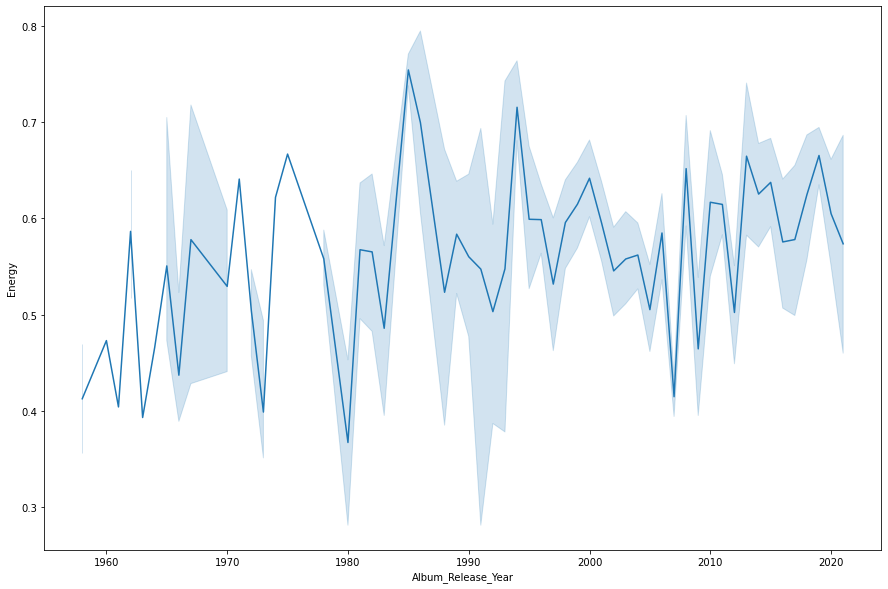

In [319]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo6_new, ax=ax )

There is an increase in Energy after 1965

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

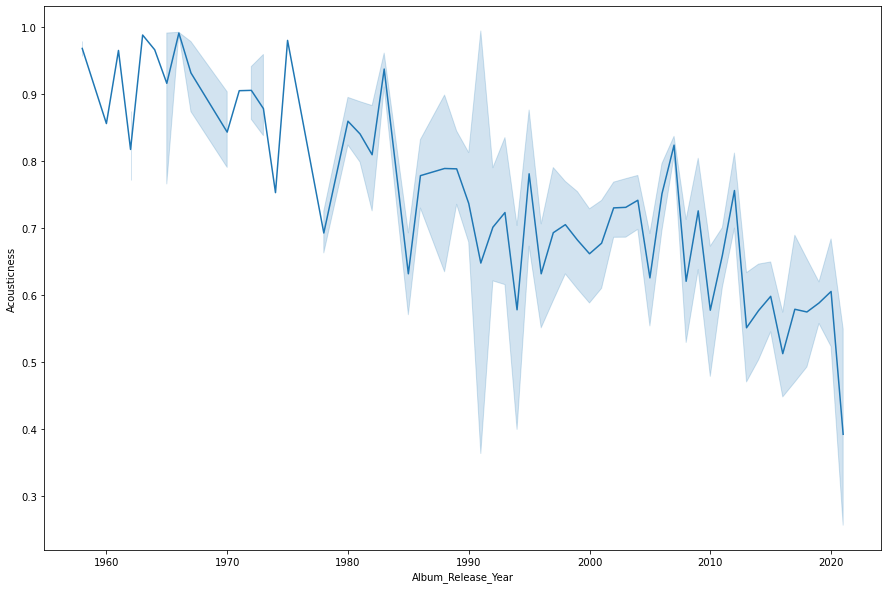

In [320]:
ig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo6_new, ax=ax )

There is an decrease in Acousticness after 1970

###### Which songs has most popularities?

In [321]:
highest_rated_songs6 = devo6_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs6

959    60
221    47
234    45
349    45
362    45
Name: Popularity, dtype: int64

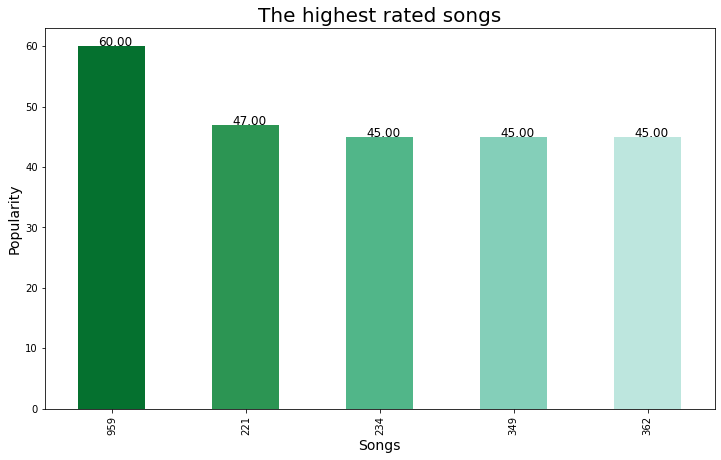

In [322]:
highest_rated_songs6.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs6.index):
    plt.text(x=x-0.1,y=highest_rated_songs6.loc[index],s='{:.2f}'.format(highest_rated_songs6.loc[index]),fontsize=12)


In [31]:
top10_songs = devo6_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [323]:
lowest_rated_songs6 = devo6_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs6

0      0
659    0
660    0
661    0
662    0
Name: Popularity, dtype: int64

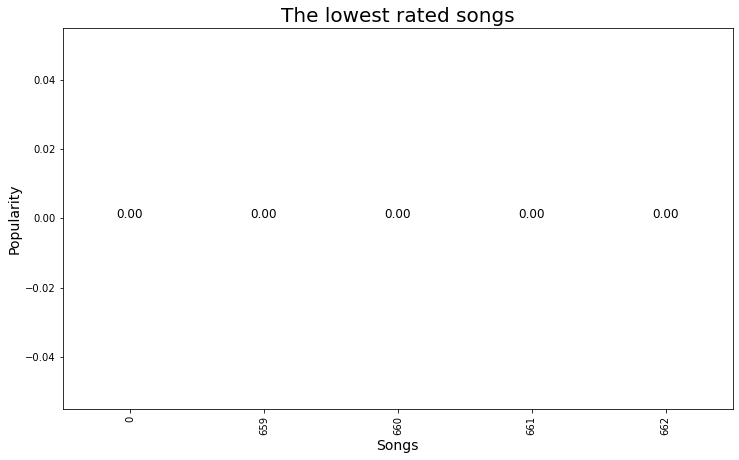

In [324]:
lowest_rated_songs6.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs6.index):
    plt.text(x=x-0.1,y=lowest_rated_songs6.loc[index],s='{:.2f}'.format(lowest_rated_songs6.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [327]:
top_artists = devo6_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [328]:
top_artists

Artist_Name                                                        
L. R. Eswari                                                           212
Dharmapuram P. Swaminathan                                             178
Pushpavanam Kuppusamy                                                  118
Sirkazhi Govindarajan                                                   89
T. M. Soundararajan                                                     76
                                                                      ... 
Madhu Balakrishnan, Manu                                                 1
Maharajapuram Santhanam                                                  1
Malathi                                                                  1
Malathi, Hiphop Tamizha, Anthony Daasan, Vishnu Priya                    1
Vivek - Mervin, Nithyasree Mahadevan, Prashanthi, Vignesh Natarajan      1
Length: 234, dtype: int64

In [329]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

C:\Users\D_R\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

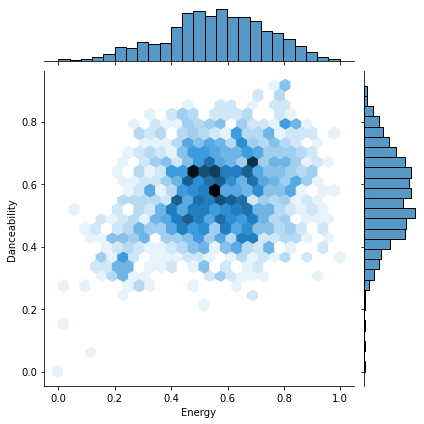

In [330]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo6_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.7 index while most numbers of songs have danceability between 0.4 to 0.6.

###### Who makes the most “Danceable” music?

In [332]:
devo6_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
650,Pushpavanam Kuppusamy,0.915
633,Pushpavanam Kuppusamy,0.914
624,Pushpavanam Kuppusamy,0.912
645,Pushpavanam Kuppusamy,0.912
674,Pushpavanam Kuppusamy,0.910
858,K. J. Yesudas,0.908
630,Pushpavanam Kuppusamy,0.896
647,Pushpavanam Kuppusamy,0.894
292,Rajalakshmee Sanjay,0.881
1054,Rajalakshmee Sanjay,0.881


###### Most Popular Genres

In [333]:
devo6_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
959,"filmi,tamil pop,filmi,malayalam pop",60
221,tamil devotional,47
234,"bhajan,classic bollywood,desi pop,filmi,ghazal...",45
349,"desi hip hop,desi pop,filmi,modern bollywood",45
362,tamil pop,45
222,tamil devotional,45
381,"carnatic vocal,indian classical",44
1003,tamil devotional,44
237,Unknown,44
1358,"classic kollywood,filmi",43


In [32]:
top10_genres = devo6_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Telugu Songs

In [33]:
devo7_new = pd.read_csv('telugu_devotional_songs_new.csv')

In [34]:
devo7_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Sri Venkatesa Suprabatham,Anuradha Krishnamoorthy,Suprabatham,Anuradha Krishnamoorthy,21-11-1999,1999,1,1,1301269,1301.269,...,-5.947,1,0.0541,0.766,0.00000,0.0895,0.835,86.747,3,Telugu
1,Shree Ganeshay Dheemahi,Ajay-Atul,Ganesha Symphonic Chants Experience,Ajay-Atul,2001,2001,1,3,407706,407.706,...,-15.063,0,0.0331,0.728,0.00000,0.1020,0.512,139.832,4,Telugu
2,Kondalalo Nelakonna,"Annamayya Keerthana, S. P. Balasubrahmanyam",Annamayya,M. M. Keeravani,01-01-1997,1997,1,12,89202,89.202,...,-8.058,1,0.0903,0.536,0.00754,0.2730,0.611,77.854,4,Telugu
3,Paluke Bangaramayera,"M. M. Keeravani, K. S. Chithra",Sri Ramadasu,M. M. Keeravani,13-01-2006,2006,1,13,237718,237.718,...,-7.138,0,0.0279,0.672,0.00000,0.0810,0.492,95.933,4,Telugu
4,Andhari Bhanduvayya,S. P. Balasubrahmanyam,Devullu,Vandemataram Srinivas,09-05-2001,2001,1,2,340656,340.656,...,-5.127,0,0.0856,0.187,0.00000,0.7370,0.703,89.943,4,Telugu


In [35]:
devo7_new.shape

(634, 27)

In [337]:
devo7_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

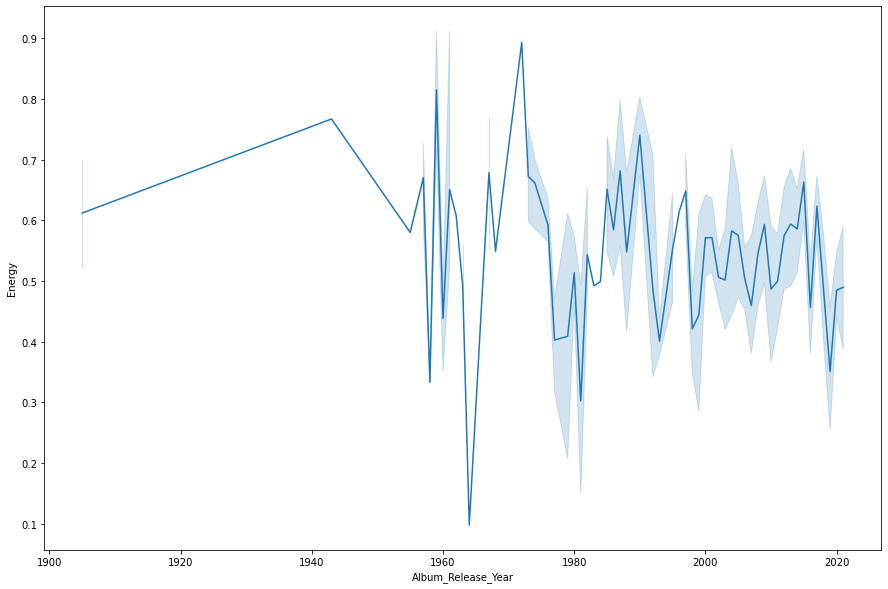

In [338]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo7_new, ax=ax )

There is no increase in Energy 

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

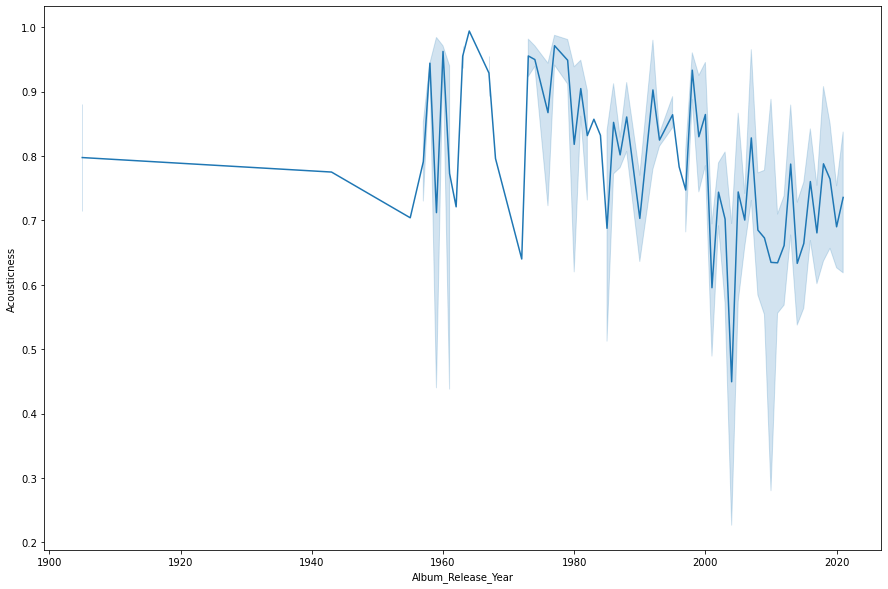

In [339]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo7_new, ax=ax )

There is an decrease in Acousticness after 1980

###### Which songs has most popularities?

In [340]:
highest_rated_songs7 = devo7_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs7

160    59
10     57
95     56
103    54
153    50
Name: Popularity, dtype: int64

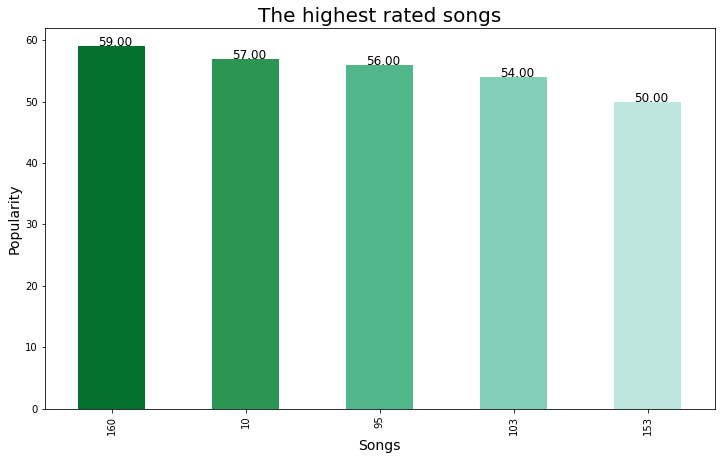

In [341]:
highest_rated_songs7.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs7.index):
    plt.text(x=x-0.1,y=highest_rated_songs7.loc[index],s='{:.2f}'.format(highest_rated_songs7.loc[index]),fontsize=12)


In [36]:
top10_songs = devo7_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [342]:
lowest_rated_songs7 = devo7_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs7

316    0
223    0
224    0
542    0
232    0
Name: Popularity, dtype: int64

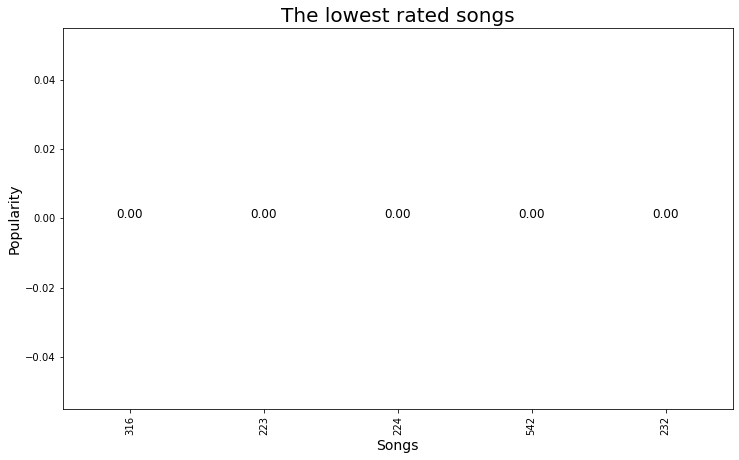

In [343]:
lowest_rated_songs7.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs7.index):
    plt.text(x=x-0.1,y=lowest_rated_songs7.loc[index],s='{:.2f}'.format(lowest_rated_songs7.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [344]:
top_artists = devo7_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [345]:
top_artists

Artist_Name                          
S. P. Balasubrahmanyam                   50
Ghantasala                               37
M. S. Subbulakshmi, Radha Viswanathan    30
Parupalli Ranganath                      23
M. S. Subbulakshmi                       21
                                         ..
Nanditha                                  1
Nanditha, Hemant Kumar                    1
Nithya Santhoshini, Gayatri               1
Nithyasree Mahadevan                      1
Vijay Yesudas                             1
Length: 241, dtype: int64

In [31]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

NameError: name 'top_artists' is not defined

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

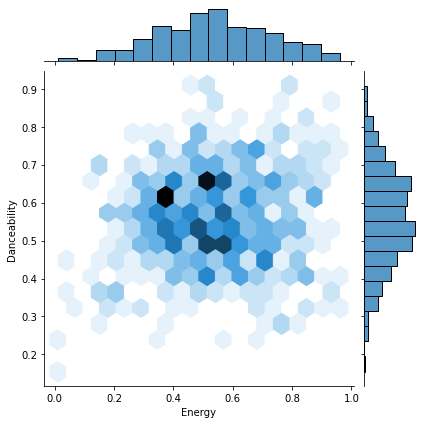

In [347]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo7_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.3 TO 0.6 index while most numbers of songs have danceability between 0.4 to 0.6.

###### Who makes the most “Danceable” music?

In [348]:
devo7_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
498,K. J. Yesudas,0.908
297,K. J. Yesudas,0.908
346,Sindhu,0.897
375,Swetha,0.896
373,Swetha,0.891
393,Sri,0.868
238,S. P. Balasubrahmanyam,0.855
383,Hamsa Lekha,0.846
576,Chorus,0.846
124,Chorus,0.812


###### Most Popular Genres

In [349]:
devo7_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
160,"tollywood,tollywood",59
10,"desi hip hop,desi pop,filmi,modern bollywood,d...",57
95,"desi hip hop,desi pop,filmi,modern bollywood",56
103,sufi,54
153,"bhajan,classic bollywood,desi pop,filmi,ghazal...",50
116,"classic tollywood,filmi",46
43,"desi hip hop,desi pop,filmi,modern bollywood",45
322,"bhajan,classic bollywood,desi pop,filmi,ghazal...",45
1,"desi hip hop,desi pop,filmi,modern bollywood",45
26,"telugu devotional,filmi",45


In [37]:
top10_genres = devo7_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

### Malayalam Songs

In [38]:
devo8_new = pd.read_csv('malayalam_devotional_songs_new.csv')

In [39]:
devo8_new.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Makarasankrama,Madhu Balakrishnan,Thiruvabharanam (Ayyappa Songs),Madhu Balakrishnan,31-07-1998,1998,1,2,256506,256.506,...,-7.998,1,0.0328,0.6350,0.000357,0.0679,0.945,144.999,4,Malayalam
1,Aalilakkanna,Sujatha,Lord Krishna Special,Various Artists,17-11-2015,2015,1,13,341188,341.188,...,-3.622,1,0.0330,0.6780,0.007530,0.0907,0.670,116.034,4,Malayalam
2,"Thrisivaperoor Vadakkumnathan - From ""Rudraksham""",P. Jayachandran,"Thrisivaperoor Vadakkumnathan (From ""Rudraksham"")",P. Jayachandran,13-07-2019,2019,1,1,242680,242.680,...,-6.007,1,0.0447,0.2930,0.002140,0.0629,0.961,162.066,4,Malayalam
3,Kai Thozham,K. S. Chithra,Devi Darshanam,K. S. Chithra,18-02-2019,2019,1,4,289013,289.013,...,-6.268,1,0.0338,0.4720,0.000096,0.1340,0.740,82.035,4,Malayalam
4,Ksheera Sagara Sayana,M. G. Sreekumar,"Sudarsanam, Vol. 2",M. G. Sreekumar,12-10-2018,2018,1,1,372218,372.218,...,-7.976,1,0.0354,0.0955,0.000000,0.3110,0.829,156.199,4,Malayalam


In [352]:
devo8_new.shape

(4072, 27)

In [353]:
devo8_new.dtypes

Track_Name                      object
Artist_Name                     object
Album_Name                      object
Album_Artist_Name               object
Album_Release_Date              object
Album_Release_Year               int64
Disc_Number                      int64
Track_Number                     int64
Track_Duration_Milliseconds      int64
Track_Duration_Seconds         float64
Track_Duration_Minutes         float64
Explicit                          bool
Popularity                       int64
Artist_Genres                   object
Danceability                   float64
Energy                         float64
Key                              int64
Loudness                       float64
Mode                             int64
Speechiness                    float64
Acousticness                   float64
Instrumentalness               float64
Liveness                       float64
Valence                        float64
Tempo                          float64
Time_Signature           

###### Energy Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Energy'>

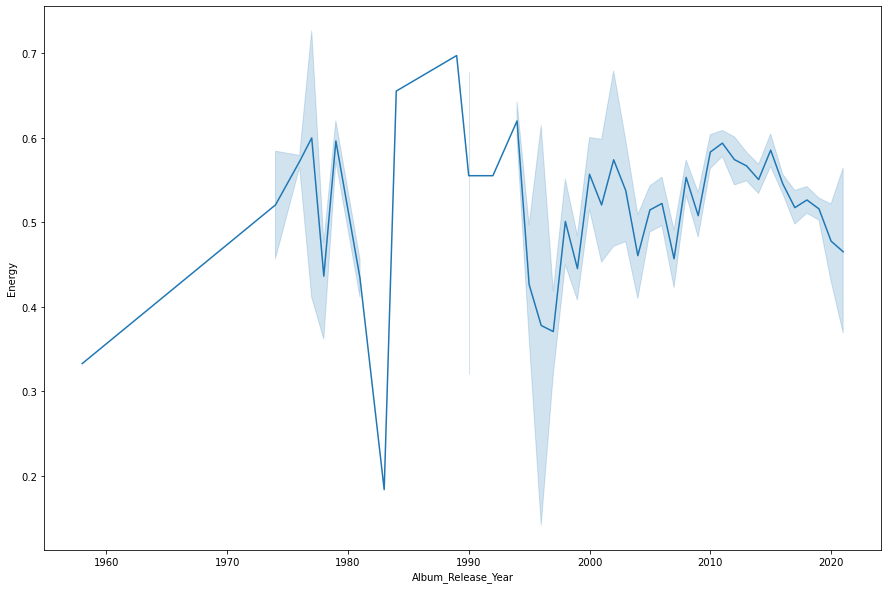

In [354]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Energy", data = devo8_new, ax=ax )

There is a consistency in Energy after 1990

###### Acousticnes Trend According to the Years

<AxesSubplot:xlabel='Album_Release_Year', ylabel='Acousticness'>

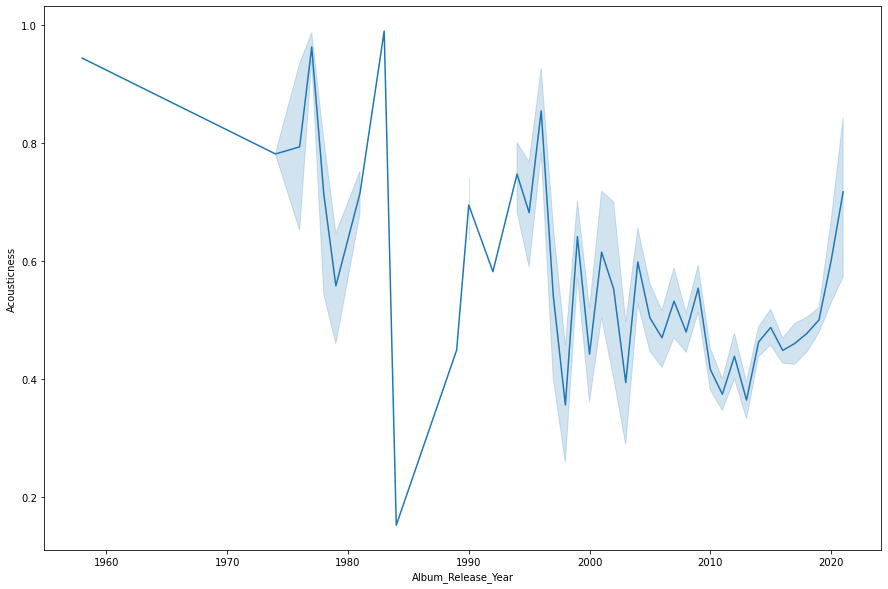

In [355]:
fig, ax = plt.subplots(figsize = (15,10))
sns.lineplot(x = "Album_Release_Year", y = "Acousticness", data = devo8_new, ax=ax )

There is an decrease in Acousticness after 1960

###### Which songs has most popularities?

In [356]:
highest_rated_songs8 = devo8_new['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs8

3768    74
3769    53
3834    53
43      52
3940    48
Name: Popularity, dtype: int64

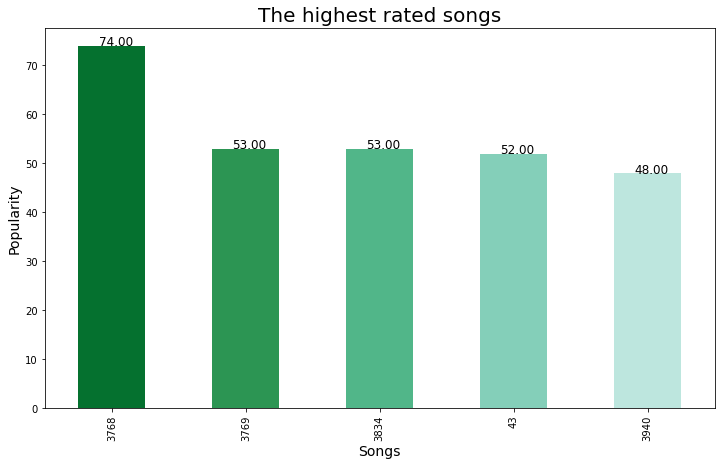

In [357]:
highest_rated_songs8.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs8.index):
    plt.text(x=x-0.1,y=highest_rated_songs8.loc[index],s='{:.2f}'.format(highest_rated_songs8.loc[index]),fontsize=12)

In [40]:
top10_songs = devo8_new.nlargest(10, 'Popularity')
fig = px.bar(top10_songs, x='Track_Name', y=['Energy', 'Danceability' ,'Popularity'], barmode='group')
fig.show()

###### Which songs has lowest popularities?

In [358]:
lowest_rated_songs8 = devo8_new['Popularity'].sort_values(ascending=True).head(5)
lowest_rated_songs8

4071    0
3064    0
3063    0
3062    0
3059    0
Name: Popularity, dtype: int64

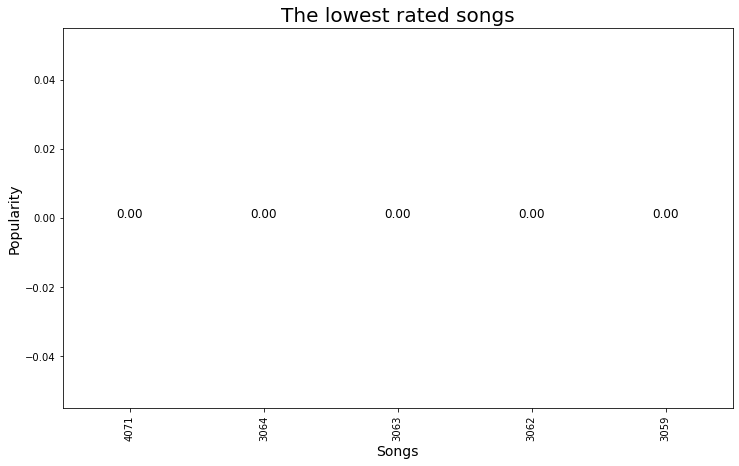

In [359]:
lowest_rated_songs8.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The lowest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(lowest_rated_songs8.index):
    plt.text(x=x-0.1,y=lowest_rated_songs8.loc[index],s='{:.2f}'.format(lowest_rated_songs8.loc[index]),fontsize=12)

###### Which artist has worked on most songs?

In [360]:
top_artists = devo8_new[['Artist_Name']].sort_values('Artist_Name', ascending = False).value_counts()

In [361]:
top_artists

Artist_Name                                                                                               
Kester                                                                                                        431
Wilson Piravom                                                                                                203
K. S. Chithra                                                                                                 142
K. G. Markose                                                                                                 135
Biju Narayanan                                                                                                108
                                                                                                             ... 
Hima, Saranya, Vaisakh                                                                                          1
Immanuel Henrey                                                                                

In [362]:
plt.figure(figsize = (15, 15))
chart = sns.barplot('Artist_Name', data = top_artists, palette = 'vlag')
chart.set_xticklabels(chart.get_xticklabels(), rotation = 45)
chart.set(xlabel = 'Artist', ylabel = 'No. Of Songs')

C:\Users\D_R\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: Could not interpret input 'Artist_Name'

<Figure size 1080x1080 with 0 Axes>

###### Relation Between Danceability and Energy

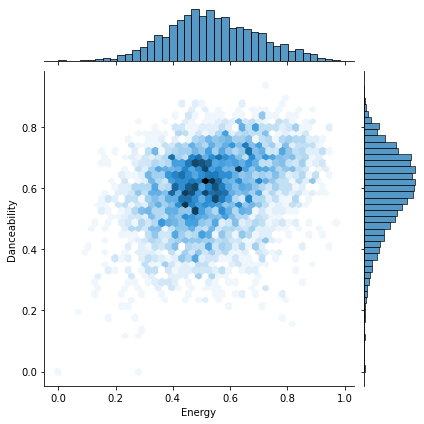

In [363]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo8_new[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

Energy and danceability are highly correlated. Most numbers of songs have energy between 0.4 to 0.6 index while most numbers of songs have danceability between 0.4 to 0.7.

###### Who makes the most “Danceable” music?

In [364]:
devo8_new[['Artist_Name', 'Danceability']].sort_values('Danceability', ascending = False)[0:10]

,Artist_Name,Danceability
78,Selin Jose,0.934
1241,Aldriya,0.897
368,K. G. Markose,0.888
3276,K. G. Markose,0.879
126,Jayachanrdan,0.875
1232,Manikandan,0.874
120,Mano,0.872
2260,Joy John,0.869
99,"Anaida Ancil, Sariga, Riya Das, Beena Praisely...",0.869
83,"Anaida Ancil, Sariga, Riya Das",0.866


###### Most Popular Genres

In [365]:
devo8_new[['Artist_Genres', 'Popularity']].sort_values('Popularity', ascending = False)[0:10]

,Artist_Genres,Popularity
3768,"dance pop,pop",74
3769,"filmi,tamil pop",53
3834,"filmi,tollywood,telugu indie,tollywood",53
43,"desi pop,filmi,modern bollywood",52
3940,"carnatic,carnatic vocal,indian classical",48
3782,mollywood,46
3836,"desi hip hop,desi pop,filmi,modern bollywood",45
3833,tollywood,44
3835,Unknown,44
3811,"desi hip hop,desi pop,filmi,modern bollywood",42


In [41]:
top10_genres = devo8_new.nlargest(10, 'Popularity')
fig = px.bar(top10_genres, x='Artist_Genres', y=['Energy', 'Danceability', 'Acousticness'], barmode='group')
fig.show()

In [42]:
import plotly.express as px 
sound_features = ['Acousticness', 'Instrumentalness']
fig = px.line(devo8_new, x='Album_Release_Year', y=sound_features)
fig.show()

In [43]:
fig = px.line(devo8_new, x='Album_Release_Year', y='Tempo')
fig.show()

### Merging of multiple columns

In [43]:
frames = [['hindi_devotional_songs_new.csv', 'marathi_devotional_songs_new.csv', 'gujarati_devotional_songs_new.csv', 'punjabi_devotional_songs_new.csv', 'sanskrit_devotional_songs_new.csv', 'malayalam_devotional_songs_new.csv', 'tamil_devotional_songs_new.csv', 'telugu_devotional_songs_new.csv']]

In [44]:
#devo_merge = pd.concat(frames)
devo_merge = pd.concat(map(pd.read_csv, ['hindi_devotional_songs_new.csv', 'marathi_devotional_songs_new.csv', 'gujarati_devotional_songs_new.csv', 'punjabi_devotional_songs_new.csv', 'sanskrit_devotional_songs_new.csv', 'malayalam_devotional_songs_new.csv', 'tamil_devotional_songs_new.csv', 'telugu_devotional_songs_new.csv']), ignore_index = True)
devo_merge.head()

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,Namo Namo,Amit Trivedi,Kedarnath,Amit Trivedi,27-11-2018,2018,1,1,322250,322.250,...,-6.216,1,0.0304,0.436,0.000000,0.1210,0.330,119.935,4,Hindi
1,Shree Hanuman Chalisa,Hariharan,Shree Hanuman Chalisa (Hanuman Ashtak),Hariharan,01-01-1992,1992,1,1,586075,586.075,...,-3.400,1,0.0350,0.545,0.000000,0.1320,0.831,91.010,4,Hindi
2,Achutam Keshavam,Vikram Hazra,Amrit,Vikram Hazra,01-01-2008,2008,1,1,348333,348.333,...,-11.508,1,0.0439,0.218,0.000000,0.0797,0.661,92.521,4,Hindi
3,Achyutam Keshavam,Shreya Ghoshal,Achyutam Keshavam,Shreya Ghoshal,07-08-2019,2019,1,1,279754,279.754,...,-13.165,1,0.1240,0.656,0.000151,0.1600,0.165,85.047,4,Hindi
4,Shendur Laal Chadhayo (Aarti),Ravindra Sathe,Vaastav: The Reality,"Jatin-Lalit, Rahul Ranade",28-08-1999,1999,1,6,194253,194.253,...,-12.760,1,0.0648,0.549,0.000115,0.4280,0.722,125.518,4,Hindi


In [392]:
devo_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10703 entries, 0 to 10702
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Track_Name                   10703 non-null  object 
 1   Artist_Name                  10703 non-null  object 
 2   Album_Name                   10703 non-null  object 
 3   Album_Artist_Name            10703 non-null  object 
 4   Album_Release_Date           10703 non-null  object 
 5   Album_Release_Year           10703 non-null  int64  
 6   Disc_Number                  10703 non-null  int64  
 7   Track_Number                 10703 non-null  int64  
 8   Track_Duration_Milliseconds  10703 non-null  int64  
 9   Track_Duration_Seconds       10703 non-null  float64
 10  Track_Duration_Minutes       10703 non-null  float64
 11  Explicit                     10703 non-null  bool   
 12  Popularity                   10703 non-null  int64  
 13  Artist_Genres   

In [393]:
devo_merge.shape

(10703, 27)

In [401]:
devo_merge.to_csv('devo_merge_new.csv', index = False)

In [44]:
devo_merge1 = pd.read_csv('devo_merge_new.csv')
devo_merge1.head()

,User_Id,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language
0,1,Namo Namo,Amit Trivedi,Kedarnath,Amit Trivedi,27-11-2018,2018,1,1,322250,...,-6.216,1,0.0304,0.436,0.000000,0.1210,0.330,119.935,4,Hindi
1,2,Shree Hanuman Chalisa,Hariharan,Shree Hanuman Chalisa (Hanuman Ashtak),Hariharan,01-01-1992,1992,1,1,586075,...,-3.400,1,0.0350,0.545,0.000000,0.1320,0.831,91.010,4,Hindi
2,3,Achutam Keshavam,Vikram Hazra,Amrit,Vikram Hazra,01-01-2008,2008,1,1,348333,...,-11.508,1,0.0439,0.218,0.000000,0.0797,0.661,92.521,4,Hindi
3,4,Achyutam Keshavam,Shreya Ghoshal,Achyutam Keshavam,Shreya Ghoshal,07-08-2019,2019,1,1,279754,...,-13.165,1,0.1240,0.656,0.000151,0.1600,0.165,85.047,4,Hindi
4,5,Shendur Laal Chadhayo (Aarti),Ravindra Sathe,Vaastav: The Reality,"Jatin-Lalit, Rahul Ranade",28-08-1999,1999,1,6,194253,...,-12.760,1,0.0648,0.549,0.000115,0.4280,0.722,125.518,4,Hindi


In [45]:
devo_merge1.columns

Index(['User_Id', 'Track_Name', 'Artist_Name', 'Album_Name',
       'Album_Artist_Name', 'Album_Release_Date', 'Album_Release_Year',
       'Disc_Number', 'Track_Number', 'Track_Duration_Milliseconds',
       'Track_Duration_Seconds', 'Track_Duration_Minutes', 'Explicit',
       'Popularity', 'Artist_Genres', 'Danceability', 'Energy', 'Key',
       'Loudness', 'Mode', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Time_Signature', 'Language'],
      dtype='object')

In [46]:
devo_merge1.shape

(10700, 28)

In [47]:
import plotly.express as px 
sound_features = ['Acousticness', 'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Valence']
fig = px.line(devo_merge1, x='Album_Release_Year', y=sound_features)
fig.show()

In [48]:
fig = px.line(devo_merge1, x='Album_Release_Year', y='Tempo')
fig.show()

In [49]:
top10_artist = devo_merge1.nlargest(10, 'Popularity')
fig = px.bar(top10_artist, x='Artist_Name', y=['Energy' ,'Acousticness'], barmode='group')
fig.show()

In [50]:
fig = px.line(devo_merge1, x='Popularity', y='Tempo')
fig.show()

<AxesSubplot:>

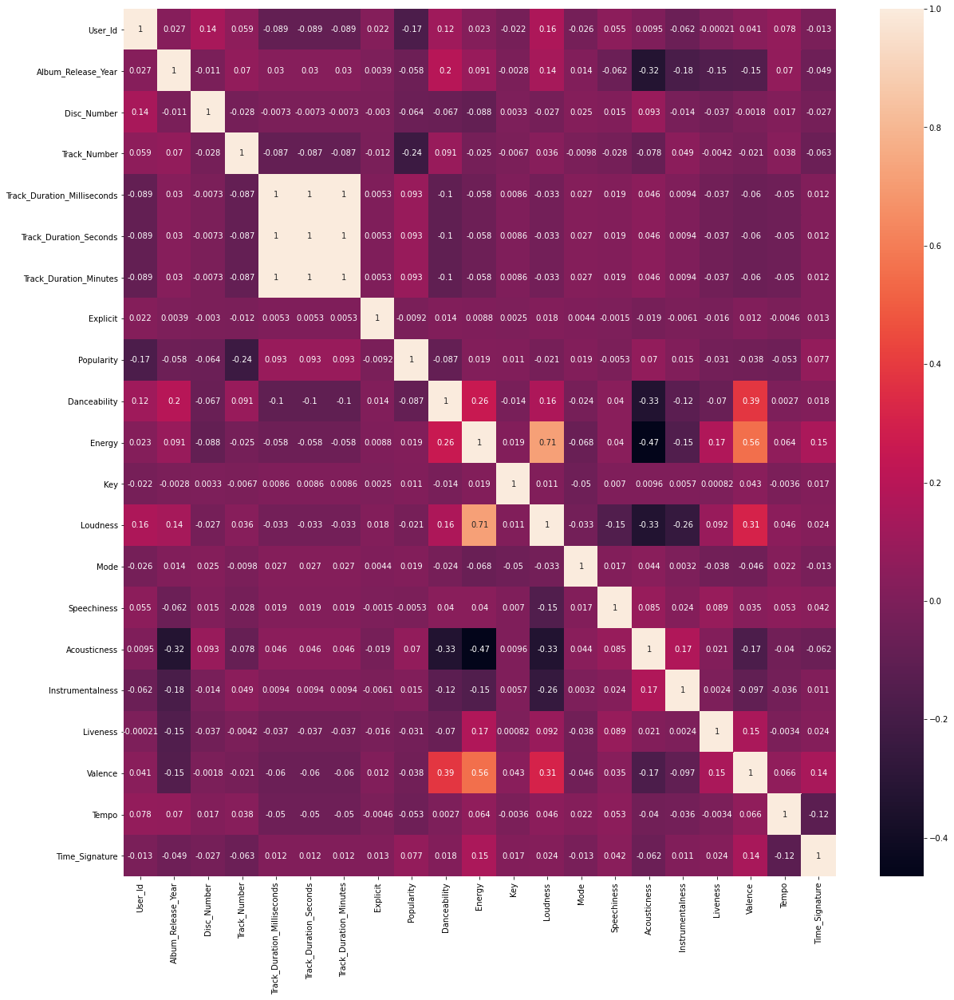

In [21]:
corr1 = devo_merge1.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr1, xticklabels = corr1.columns, yticklabels=corr1.columns, annot  = True)

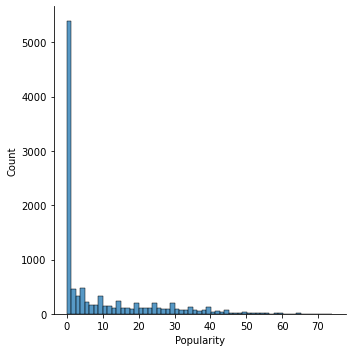

In [19]:
sns.displot(devo_merge1['Popularity'])

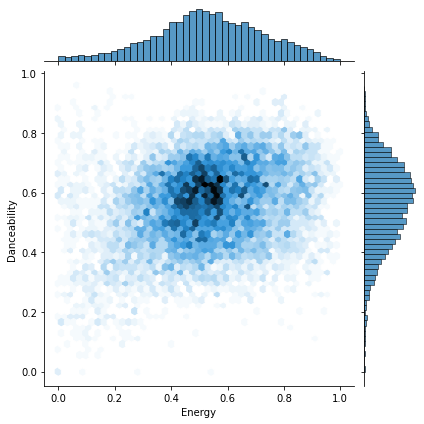

In [25]:
sns.jointplot(x = 'Energy', y = 'Danceability', data = devo_merge1[['Energy', 'Danceability']], kind = 'hex').set_axis_labels('Energy', 'Danceability')

In [27]:
highest_rated_songs = devo_merge1['Popularity'].sort_values(ascending=False).head(5)
highest_rated_songs

8350    74
629     74
0       71
519     71
493     71
Name: Popularity, dtype: int64

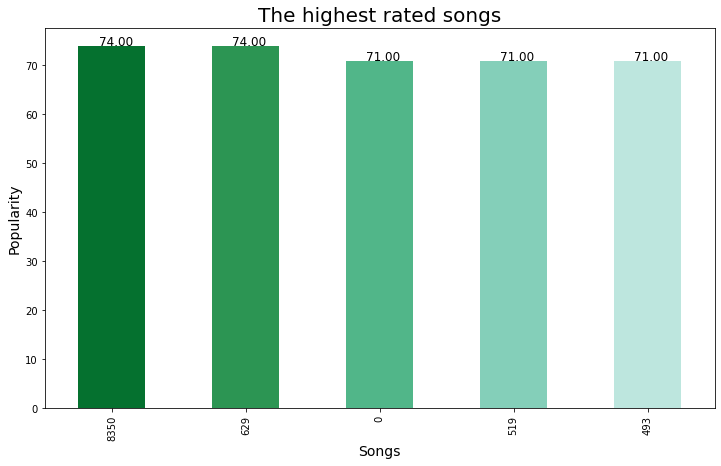

In [28]:
highest_rated_songs.plot(kind='bar', figsize=(12,7), color=sns.color_palette("BuGn_r"))
plt.title('The highest rated songs',fontsize=20)
plt.xlabel('Songs',fontsize=14)
plt.ylabel('Popularity',fontsize=14)
for x,index in enumerate(highest_rated_songs.index):
    plt.text(x=x-0.1,y=highest_rated_songs.loc[index],s='{:.2f}'.format(highest_rated_songs.loc[index]),fontsize=12)

In [43]:
devo_merge1['Track_Number'].value_counts()

1     1797
2     1107
3      976
4      894
5      868
6      754
7      717
8      648
9      512
10     417
11     282
12     259
13     185
14     151
15     130
16      94
18      73
17      71
19      65
20      57
22      47
21      43
24      40
23      38
28      33
25      32
27      31
26      30
30      29
29      27
32      26
36      25
31      25
33      23
35      22
34      21
37      19
38      19
39      15
43      12
40      11
42      10
41      10
44      10
46       9
45       8
48       7
47       6
50       5
49       5
51       2
53       1
52       1
65       1
Name: Track_Number, dtype: int64

<__array_function__ internals>:5: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.

<__array_function__ internals>:5: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



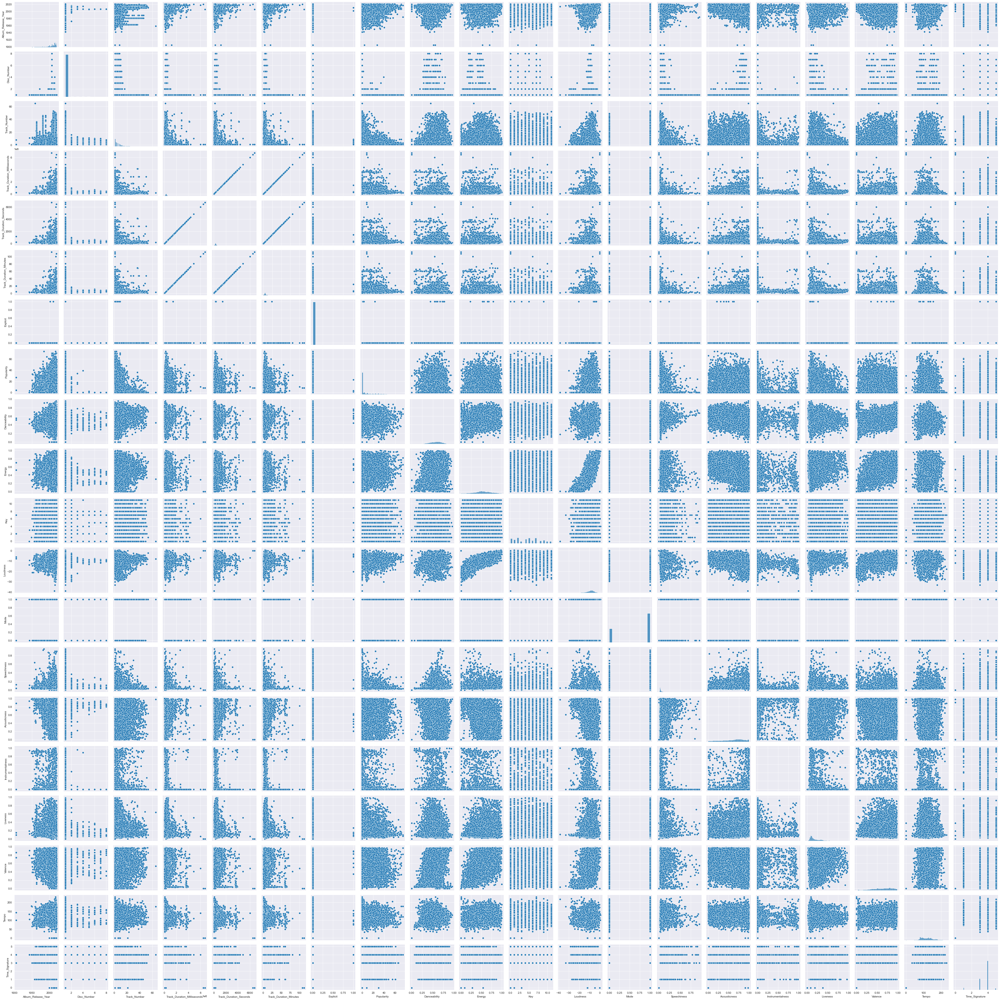

In [80]:
sns.set_style(style = 'darkgrid')
sns.pairplot(devo_merge1)

In [44]:
devo_merge1.corr(method ='kendall')

,User_Id,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,Track_Duration_Minutes,Explicit,Popularity,Danceability,...,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature
User_Id,1.000000,0.022190,0.112557,0.063252,-0.078058,-0.078058,-0.078058,0.018283,-0.140849,0.073344,...,-0.013608,0.094677,-0.021136,0.040122,0.012543,0.020379,0.023060,0.027563,0.056581,-0.029551
Album_Release_Year,0.022190,1.000000,-0.052765,0.039680,-0.002673,-0.002673,-0.002673,-0.005209,-0.032862,0.113879,...,0.003053,0.118140,0.007979,-0.076522,-0.191201,-0.027781,-0.076956,-0.111132,0.037033,-0.042356
Disc_Number,0.112557,-0.052765,1.000000,-0.004500,0.027600,0.027600,0.027600,-0.003616,-0.072547,-0.071608,...,0.012159,-0.046002,0.021730,0.046627,0.083733,-0.057314,-0.023589,-0.011571,0.008699,-0.018240
Track_Number,0.063252,0.039680,-0.004500,1.000000,-0.113477,-0.113477,-0.113477,-0.010322,-0.209943,0.066113,...,-0.003992,0.021740,-0.013883,-0.055303,-0.056919,0.037617,0.012351,-0.003048,0.024780,-0.066996
Track_Duration_Milliseconds,-0.078058,-0.002673,0.027600,-0.113477,1.000000,1.000000,1.000000,0.003141,0.044539,-0.073640,...,0.008277,0.009766,-0.015467,-0.032722,-0.038490,-0.046000,-0.010602,-0.026645,-0.022049,0.038527
Track_Duration_Seconds,-0.078058,-0.002673,0.027600,-0.113477,1.000000,1.000000,1.000000,0.003141,0.044539,-0.073640,...,0.008277,0.009766,-0.015467,-0.032722,-0.038490,-0.046000,-0.010602,-0.026645,-0.022049,0.038527
Track_Duration_Minutes,-0.078058,-0.002673,0.027600,-0.113477,1.000000,1.000000,1.000000,0.003141,0.044539,-0.073640,...,0.008277,0.009766,-0.015467,-0.032722,-0.038490,-0.046000,-0.010602,-0.026645,-0.022049,0.038527
Explicit,0.018283,-0.005209,-0.003616,-0.010322,0.003141,0.003141,0.003141,1.000000,0.004377,0.011754,...,0.002248,0.023060,0.004388,-0.009150,-0.017557,-0.014658,-0.016025,0.010140,-0.003350,0.011730
Popularity,-0.140849,-0.032862,-0.072547,-0.209943,0.044539,0.044539,0.044539,0.004377,1.000000,-0.073866,...,0.025282,-0.043275,0.012161,0.030424,0.073514,-0.011422,-0.014796,0.011739,-0.037492,0.089323
Danceability,0.073344,0.113879,-0.071608,0.066113,-0.073640,-0.073640,-0.073640,0.011754,-0.073866,1.000000,...,-0.008177,0.106321,-0.016866,-0.004974,-0.233999,-0.073123,-0.043475,0.248933,0.010532,0.014301


# Model Building

### Preparing a Model

In [45]:
model = smf.ols('Popularity ~ Disc_Number + Track_Number + Track_Duration_Milliseconds + Track_Duration_Seconds + Track_Duration_Minutes + Explicit + Danceability + Energy + Key + Loudness + Mode + Speechiness + Acousticness + Instrumentalness + Liveness + Valence + Tempo + Time_Signature ', data = devo_merge1).fit()

In [46]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Popularity   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     61.60
Date:                Fri, 07 Jan 2022   Prob (F-statistic):          1.43e-190
Time:                        20:16:59   Log-Likelihood:                -42383.
No. Observations:               10700   AIC:                         8.480e+04
Df Residuals:                   10683   BIC:                         8.492e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                       7.0045      1.493      4.690      0.000       4.077       9.932
Explicit[T.True]               -5.5420      4.502     -1.231      0.218     -14.366       3.282
Disc_Number                    -2.0211      0.277     -7.309      0.000      -2.563      -1.479
Track_Number                   -0.3755      0.017    -22.590      0.000      -0.408      -0.343
Track_Duration_Milliseconds -3748.6765   2296.174     -1.633      0.103   -8249.604     752.251
Track_Duration_Seconds      -1245.2341    762.742     -1.633      0.103   -2740.351     249.883
Track_Duration_Minutes        2.25e+08   1.38e+08      1.633      0.103   -4.52e+07    4.95e+08
Danceability                   -4.2671      1.046     -4.080      0.000      -6.317      -2.217
Energy                          9.7815      1.198      8.164      0.000       7.433      12.130
Key                             0.0364      0.038      0.955      0.339      -0.038       0.111
Loudness                       -0.1962      0.049     -4.036      0.000      -0.291      -0.101
Mode                            0.5040      0.264      1.910      0.056      -0.013       1.021
Speechiness                    -4.7868      1.811     -2.643      0.008      -8.338      -1.236
Acousticness                    4.0562      0.566      7.165      0.000       2.947       5.166
Instrumentalness                0.3723      0.917      0.406      0.685      -1.425       2.170
Liveness                       -3.9176      0.832     -4.710      0.000      -5.548      -2.287
Valence                        -3.6284      0.679     -5.347      0.000      -4.959      -2.298
Tempo                          -0.0143      0.004     -3.397      0.001      -0.022      -0.006
Time_Signature                  0.9330      0.167      5.573      0.000       0.605       1.261
==============================================================================
Omnibus:                     2615.127   Durbin-Watson:                   0.732
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5305.557
Skew:                           1.469   Prob(JB):                         0.00
Kurtosis:                       4.808   Cond. No.                     3.82e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.09e-22. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### Beta Coefficient

In [47]:
model.params

Intercept                      7.004475e+00
Explicit[T.True]              -5.541997e+00
Disc_Number                   -2.021055e+00
Track_Number                  -3.754998e-01
Track_Duration_Milliseconds   -3.748677e+03
Track_Duration_Seconds        -1.245234e+03
Track_Duration_Minutes         2.249953e+08
Danceability                  -4.267051e+00
Energy                         9.781511e+00
Key                            3.644993e-02
Loudness                      -1.961693e-01
Mode                           5.040269e-01
Speechiness                   -4.786816e+00
Acousticness                   4.056190e+00
Instrumentalness               3.723435e-01
Liveness                      -3.917618e+00
Valence                       -3.628352e+00
Tempo                         -1.425957e-02
Time_Signature                 9.329790e-01
dtype: float64

### t values and p values

In [48]:
print(model.tvalues, '\n' ,model.pvalues)

Intercept                       4.690277
Explicit[T.True]               -1.231088
Disc_Number                    -7.309351
Track_Number                  -22.589946
Track_Duration_Milliseconds    -1.632575
Track_Duration_Seconds         -1.632575
Track_Duration_Minutes          1.632575
Danceability                   -4.079754
Energy                          8.164384
Key                             0.955440
Loudness                       -4.036339
Mode                            1.909831
Speechiness                    -2.642599
Acousticness                    7.165422
Instrumentalness                0.406031
Liveness                       -4.709680
Valence                        -5.346530
Tempo                          -3.396725
Time_Signature                  5.573062
dtype: float64 
 Intercept                       2.762178e-06
Explicit[T.True]                2.183170e-01
Disc_Number                     2.876271e-13
Track_Number                   2.046844e-110
Track_Duration_Milliseco

### R Squared values

In [49]:
(model.rsquared, model.rsquared_adj)

(0.08447185859258677, 0.08310066601910382)

In [114]:
### Error and Predicted Values

In [115]:
#devo_merge1['Predicted'] = model.fittedvalues
#devo_merge1['Errors'] = model.resid
#devo_merge1.head(500)

### Detecting Influencers/Outliers Using Cook's Distance

In [116]:
model_influence = model.get_influence()
(c, _) = model_influence.cooks_distance

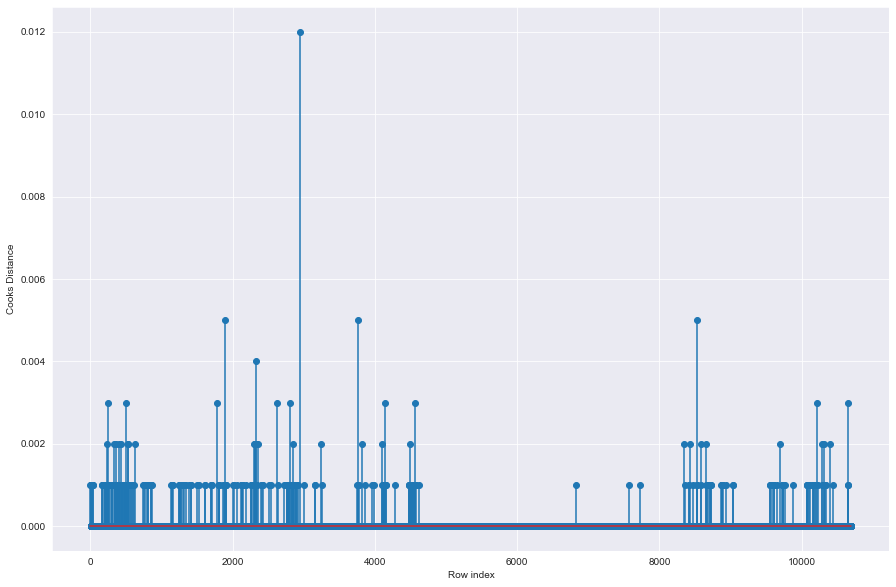

In [117]:
# Plotting the influence values using stem plot
fig = plt.subplots(figsize = (15,10))
plt.stem(np.arange(len(devo_merge1)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel('Cooks Distance')
plt.show()

In [118]:
#index and value of influencer where c is greater than .5
(np.argmax(c), np.max(c))

(2944, 0.011600738421651935)

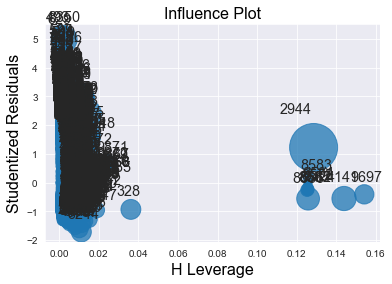

In [119]:
# Graphical Representation of High Influence Points
influence_plot(model)
plt.show()

In [120]:
devo_merge1.shape

(10700, 29)

In [121]:
# k = number of variables (columns)
# n = number of observations (rows)

k = devo_merge1.shape[1]
n = devo_merge1.shape[0]
leverage_cutoff = 3*((k + 1)/n)
leverage_cutoff

0.008411214953271028

From the above plot, it is evident that data point 2944 is influencer

In [125]:
devo_merge1[devo_merge1.index.isin([2944])]

,Track_Name,Artist_Name,Album_Name,Album_Artist_Name,Album_Release_Date,Album_Release_Year,Disc_Number,Track_Number,Track_Duration_Milliseconds,Track_Duration_Seconds,...,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time_Signature,Language,Predicted,Errors
2944,Kar Bande Tu Bandagi,Bhai Harbans Singh Ji,Kar Bande Tu Bandagi,Bhai Harbans Singh Ji,01-01-2002,2002,1,1,1450627,1450.627,...,0.238,0.627,0.0,0.153,0.602,95.06,4,Punjabi,0.0,23.0


In [126]:
# Discard the data points which are influencers and reassign the row number (reset_index())
devo_merge2 = devo_merge1.drop(devo_merge1.index[[2944]],axis = 0).reset_index()

In [29]:
# Building Recommendation Engine

In [20]:
devo_merge2 = pd.DataFrame(devo_merge1.groupby('Track_Name')['Popularity'].mean())
devo_merge2

,Popularity
Track_Name,
'Em Puchhine Thay Nahin Prem,6.0
1008 Sivan Pottri - Language: Tamil,32.0
108 Ayyapan Saranangal,41.0
108 Chants,12.0
108 Namavali,5.0
...,...
Zulmate Shab Ko,11.0
Zulmate Shab Ko Jo - Live,3.0
Zulo Zulo Mara Lal,0.0


In [21]:
devo_merge2_matrix = devo_merge1.pivot_table(index = 'Album_Name', columns = 'Track_Name', values ='Popularity')
devo_merge2_matrix.head()

Track_Name,'Em Puchhine Thay Nahin Prem,1008 Sivan Pottri - Language: Tamil,108 Ayyapan Saranangal,108 Chants,108 Namavali,108 Vinayagar Pottri,51 SHAKTI PEETH PART 2,7.3 Hz Drone,A Fluir,AGA KARUNAKARA,...,Zulan Morali Vagi Re,Zule Shamlo Re,Zule Shyamlore,Zule Zule Chhe Nandlal Re - Live,Zule Zule Shreenathji,Zulmate Shab Ko,Zulmate Shab Ko Jo - Live,Zulo Zulo Mara Lal,kann Kanda Theivame,إنت إلهي
Album_Name,,,,,,,,,,,,,,,,,,,,,
1 Giant Leap,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10 Divine Gayatri Mantras,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10 Million Moons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10 Super hits kirtidan gadhavi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100 Shabad (Vol-4),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
devo_merge2_matrix_new = devo_merge2_matrix.fillna(0)
devo_merge2_matrix_new.head()

Track_Name,'Em Puchhine Thay Nahin Prem,1008 Sivan Pottri - Language: Tamil,108 Ayyapan Saranangal,108 Chants,108 Namavali,108 Vinayagar Pottri,51 SHAKTI PEETH PART 2,7.3 Hz Drone,A Fluir,AGA KARUNAKARA,...,Zulan Morali Vagi Re,Zule Shamlo Re,Zule Shyamlore,Zule Zule Chhe Nandlal Re - Live,Zule Zule Shreenathji,Zulmate Shab Ko,Zulmate Shab Ko Jo - Live,Zulo Zulo Mara Lal,kann Kanda Theivame,إنت إلهي
Album_Name,,,,,,,,,,,,,,,,,,,,,
1 Giant Leap,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10 Divine Gayatri Mantras,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10 Million Moons,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10 Super hits kirtidan gadhavi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100 Shabad (Vol-4),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
devo_merge2.sort_values('Popularity', ascending = False).head(40)

,Popularity
Track_Name,
Despacito - Remix,74.0
Like a Virgin,74.0
Tera Hone Laga Hoon,71.0
"Mere Liye Tum Kaafi Ho (From ""Shubh Mangal Zyada Saavdhan"")",71.0
Tum Se Hi,71.0
Tujh Mein Rab Dikhta Hai,70.0
Kun Faya Kun,70.0
Dil Diyan Gallan,69.0
Mast Magan,69.0


In [28]:
devo_merge3 = devo_merge2_matrix_new["Devi Prayer"]

In [29]:
similar_devo_merge3 = devo_merge2_matrix_new.corrwith(devo_merge3)
similar_devo_merge3

Track_Name
'Em Puchhine Thay Nahin Prem          -0.000348
1008 Sivan Pottri - Language: Tamil   -0.000348
108 Ayyapan Saranangal                -0.000348
108 Chants                            -0.000348
108 Namavali                          -0.000348
                                         ...   
Zulmate Shab Ko                       -0.000348
Zulmate Shab Ko Jo - Live             -0.000348
Zulo Zulo Mara Lal                          NaN
kann Kanda Theivame                         NaN
إنت إلهي                              -0.000348
Length: 9244, dtype: float64

In [30]:
corr_devo_merge3 = pd.DataFrame(similar_devo_merge3 , columns=['corr'])
corr_devo_merge3.dropna(inplace=True)
corr_devo_merge3.head()

,corr
Track_Name,
'Em Puchhine Thay Nahin Prem,-0.000348
1008 Sivan Pottri - Language: Tamil,-0.000348
108 Ayyapan Saranangal,-0.000348
108 Chants,-0.000348
108 Namavali,-0.000348


In [31]:
corr_devo_merge3_new = corr_devo_merge3.join(devo_merge2['Popularity'])
corr_devo_merge3_new

,corr,Popularity
Track_Name,,
'Em Puchhine Thay Nahin Prem,-0.000348,6.0
1008 Sivan Pottri - Language: Tamil,-0.000348,32.0
108 Ayyapan Saranangal,-0.000348,41.0
108 Chants,-0.000348,12.0
108 Namavali,-0.000348,5.0
...,...,...
Zulan Morali Vagi Re,-0.000348,24.0
Zule Zule Chhe Nandlal Re - Live,-0.000348,2.0
Zulmate Shab Ko,-0.000348,11.0


In [32]:
devo_merge3_final = corr_devo_merge3_new[corr_devo_merge3_new['Popularity']>20].sort_values(by='corr', ascending = False)
devo_merge3_final

,corr,Popularity
Track_Name,,
Devi Prayer,1.000000,60.000000
Lalitha Ashtotram,1.000000,39.000000
Aar Nanak Paar Nanak,-0.000348,53.000000
Hechi Yel Deva Naka,-0.000348,36.000000
1008 Sivan Pottri - Language: Tamil,-0.000348,32.000000
...,...,...
Aigiri Nandini - Mahishasura Mardini Stotram,-0.000661,34.500000
Jai Ganesh Deva,-0.000673,25.285714
Om Jai Jagdish Hare,-0.000827,34.000000


In [33]:
devo_merge3_final_new = devo_merge3_final.drop('corr', axis=1)
devo_merge3_final_new

,Popularity
Track_Name,
Devi Prayer,60.000000
Lalitha Ashtotram,39.000000
Aar Nanak Paar Nanak,53.000000
Hechi Yel Deva Naka,36.000000
1008 Sivan Pottri - Language: Tamil,32.000000
...,...
Aigiri Nandini - Mahishasura Mardini Stotram,34.500000
Jai Ganesh Deva,25.285714
Om Jai Jagdish Hare,34.000000
